# DC-GANs
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

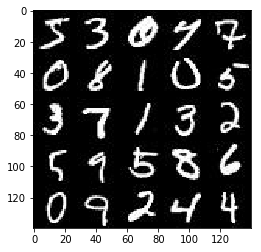

In [2]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

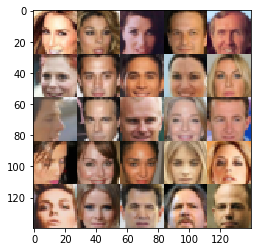

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.0


/Users/deanmwebb/anaconda/envs/aind-dog/lib/python3.5/site-packages/ipykernel/__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [44]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data)
    """
    # TODO: Implement Function
    real_input = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels]
                                )
    z_input = tf.placeholder(tf.float32, [None, z_dim])
    learning_rate = tf.placeholder(tf.float32)
    
    return real_input, z_input, learning_rate

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the generator, tensor logits of the generator).

In [45]:
def lrelu(x, leak=0.1):
    f1 = 0.5 * (1 + leak)
    f2 = 0.5 * (1 - leak)
    return f1 * x + f2 * abs(x)

In [46]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param image: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    with tf.variable_scope('discriminator', reuse=reuse):
        conv1 = tf.layers.conv2d(images, 64, (5,5), strides=(2,2), 
                                 padding='same', activation=None)
        # Leaky relu
        lrelu1 = lrelu(conv1)
        
        
        conv2 = tf.layers.conv2d(lrelu1, 128, (5,5), strides=(2,2), 
                                 padding='same', activation=None)
        # Batch normalization
        bn2 = tf.layers.batch_normalization(conv2, training=True)
        lrelu2 = lrelu(bn2)
        
        conv3 = tf.layers.conv2d(conv2, 256, (5,5), strides=(2,2), 
                                 padding='same', activation=None)
        # Batch normalization
        bn3 = tf.layers.batch_normalization(conv3, training=True)
        lrelu2 = lrelu(bn3)
        # 4x4x256
        
        # flat = tf.contrib.layers.flatten(conv3)
        flat = tf.reshape(lrelu2, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        
        # Batch normalization
        bn4 = tf.layers.batch_normalization(logits, training=True)
        output = tf.sigmoid(bn4)

    return output, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variabes in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [48]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    with tf.variable_scope('generator', reuse=not is_train):
        fc = tf.layers.dense(z, 7*7*256, activation=None) # 7*7*32
        bn0 = tf.layers.batch_normalization(fc, training=True)
        lrelu0 = lrelu(bn0)
        
        first = tf.reshape(lrelu0, (-1, 7, 7, 256))
        conv1 = tf.layers.conv2d_transpose(first, 128, (5,5), strides=(1,1), 
                                           padding='same', activation=None)
        # Add Batch normalization
        bn1 = tf.layers.batch_normalization(conv1, training=True)
        lrelu1 = lrelu(bn1)
        
        #14x14
        conv2 = tf.layers.conv2d_transpose(lrelu1, 64, (5,5), strides=(2,2),
                                           padding='same', activation=None)
        # Add Batch normalization
        bn2 = tf.layers.batch_normalization(conv2, training=True)
        lrelu2 = lrelu(bn2)
        
        #28x28
        conv3 = tf.layers.conv2d_transpose(lrelu2, out_channel_dim, (5,5), strides=(2,2),
                                           padding='same', activation=tf.nn.tanh)
        #28x28x out_channel_dim
    
    
    return conv3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [49]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, out_channel_dim)
    d_model_real, d_logits_real = discriminator(input_real)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)
    
    d_loss_real = tf.reduce_mean(
                    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real,
                                                            labels=tf.ones_like(d_logits_real)*.9))
    d_loss_fake = tf.reduce_mean(
                    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                            labels=tf.zeros_like(d_logits_real)))
    d_loss = d_loss_real + d_loss_fake
    
    g_loss = tf.reduce_mean(
                    tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake,
                                                            labels=tf.ones_like(d_logits_fake)))
    return d_loss, g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [50]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        g_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
    
    return d_opt, g_opt


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [51]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train.

In [52]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode, 
          show_every=100, print_every=15):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # Create the model inputs
    real_inputs, fake_inputs, lr_tensor = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)
    
    # Get the loss for the discriminator and generator
    d_loss, g_loss = model_loss(real_inputs, fake_inputs, data_shape[3])
    
    # Get optimization operations
    d_train_opt, g_train_opt = model_opt(d_loss, g_loss, lr_tensor, beta1)
    
    losses = []
    n_img_show = 20
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for step, batch_images in enumerate(get_batches(batch_size)):
                
                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                
                # Run optimizers
                sess.run(d_train_opt, feed_dict={real_inputs: batch_images, 
                                                 fake_inputs: batch_z, 
                                                 lr_tensor: learning_rate})
                
                sess.run(g_train_opt, feed_dict={real_inputs: batch_images, 
                                                 fake_inputs: batch_z, 
                                                 lr_tensor: learning_rate})
                
                if step % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = d_loss.eval({real_inputs: batch_images, fake_inputs: batch_z})
                    train_loss_g = g_loss.eval({fake_inputs: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))
                
                if step % show_every == 0:
                    show_generator_output(sess, n_img_show, fake_inputs, data_shape[3], data_image_mode)
        show_generator_output(sess, n_img_show, fake_inputs, data_shape[3], data_image_mode)
        print("Last train discriminator Loss: {:.4f}\nLast train generator Loss: {:.4f}".format(losses[-1][0], losses[-1][1]))
                

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.

Epoch 1/2... Discriminator Loss: 11.8868... Generator Loss: 0.0000


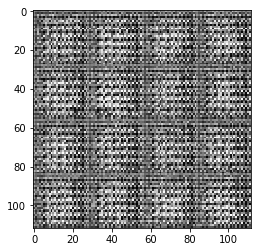

Epoch 1/2... Discriminator Loss: 1.1323... Generator Loss: 2.7108
Epoch 1/2... Discriminator Loss: 1.1501... Generator Loss: 1.2096
Epoch 1/2... Discriminator Loss: 0.6057... Generator Loss: 3.1622
Epoch 1/2... Discriminator Loss: 0.9794... Generator Loss: 1.1724
Epoch 1/2... Discriminator Loss: 2.5892... Generator Loss: 7.0398
Epoch 1/2... Discriminator Loss: 0.7645... Generator Loss: 1.3459


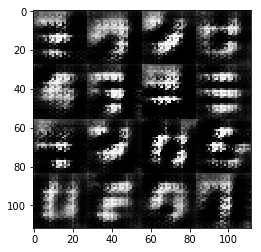

Epoch 1/2... Discriminator Loss: 0.6673... Generator Loss: 2.2948
Epoch 1/2... Discriminator Loss: 0.5026... Generator Loss: 2.4779
Epoch 1/2... Discriminator Loss: 0.6282... Generator Loss: 1.7561
Epoch 1/2... Discriminator Loss: 0.6521... Generator Loss: 2.1627
Epoch 1/2... Discriminator Loss: 1.0412... Generator Loss: 5.1026
Epoch 1/2... Discriminator Loss: 2.4362... Generator Loss: 2.9263
Epoch 1/2... Discriminator Loss: 0.7389... Generator Loss: 1.3576


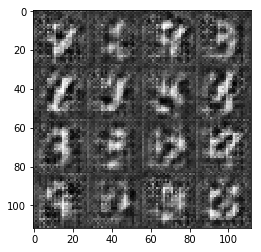

Epoch 1/2... Discriminator Loss: 0.4544... Generator Loss: 3.3089
Epoch 1/2... Discriminator Loss: 1.3526... Generator Loss: 0.7475
Epoch 1/2... Discriminator Loss: 1.4389... Generator Loss: 0.5337
Epoch 1/2... Discriminator Loss: 1.0074... Generator Loss: 0.8156
Epoch 1/2... Discriminator Loss: 1.9626... Generator Loss: 0.8465
Epoch 1/2... Discriminator Loss: 0.6776... Generator Loss: 1.5609
Epoch 1/2... Discriminator Loss: 0.9127... Generator Loss: 0.9564


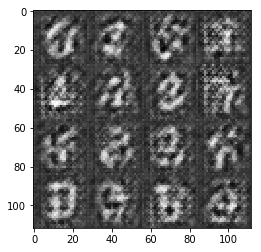

Epoch 1/2... Discriminator Loss: 0.9827... Generator Loss: 0.9262
Epoch 1/2... Discriminator Loss: 0.8493... Generator Loss: 1.2968
Epoch 1/2... Discriminator Loss: 0.7447... Generator Loss: 1.4844
Epoch 1/2... Discriminator Loss: 1.1280... Generator Loss: 2.2639
Epoch 1/2... Discriminator Loss: 0.8017... Generator Loss: 1.1257
Epoch 1/2... Discriminator Loss: 1.4707... Generator Loss: 0.4969


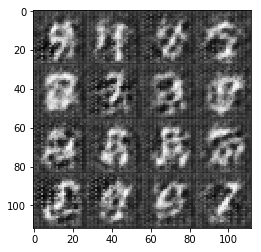

Epoch 1/2... Discriminator Loss: 0.7216... Generator Loss: 2.0108
Epoch 1/2... Discriminator Loss: 0.8096... Generator Loss: 1.0984
Epoch 1/2... Discriminator Loss: 0.5538... Generator Loss: 2.0453
Epoch 1/2... Discriminator Loss: 0.5259... Generator Loss: 2.0527
Epoch 1/2... Discriminator Loss: 1.5620... Generator Loss: 0.4325
Epoch 1/2... Discriminator Loss: 0.6068... Generator Loss: 1.8706
Epoch 1/2... Discriminator Loss: 0.5724... Generator Loss: 2.1090


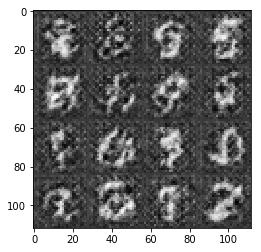

Epoch 1/2... Discriminator Loss: 0.6904... Generator Loss: 1.5122
Epoch 1/2... Discriminator Loss: 0.4531... Generator Loss: 2.9419
Epoch 1/2... Discriminator Loss: 1.3975... Generator Loss: 0.8016
Epoch 1/2... Discriminator Loss: 0.8239... Generator Loss: 2.0103
Epoch 1/2... Discriminator Loss: 0.9097... Generator Loss: 1.1017
Epoch 1/2... Discriminator Loss: 1.1258... Generator Loss: 0.7691
Epoch 1/2... Discriminator Loss: 0.6904... Generator Loss: 1.4638


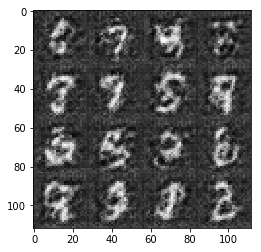

Epoch 1/2... Discriminator Loss: 0.5104... Generator Loss: 2.9163
Epoch 1/2... Discriminator Loss: 0.6619... Generator Loss: 1.4447
Epoch 1/2... Discriminator Loss: 0.5167... Generator Loss: 2.3651
Epoch 1/2... Discriminator Loss: 0.5812... Generator Loss: 1.6932
Epoch 1/2... Discriminator Loss: 1.3175... Generator Loss: 0.6664
Epoch 1/2... Discriminator Loss: 0.7670... Generator Loss: 1.2676


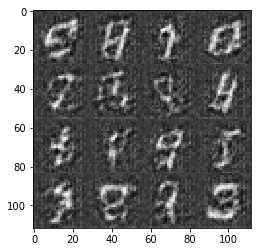

Epoch 1/2... Discriminator Loss: 0.6796... Generator Loss: 1.4603
Epoch 1/2... Discriminator Loss: 0.4967... Generator Loss: 2.2820
Epoch 1/2... Discriminator Loss: 0.5402... Generator Loss: 1.9791
Epoch 1/2... Discriminator Loss: 0.7156... Generator Loss: 1.6068
Epoch 1/2... Discriminator Loss: 0.9016... Generator Loss: 1.3023
Epoch 1/2... Discriminator Loss: 0.4613... Generator Loss: 2.5395
Epoch 1/2... Discriminator Loss: 1.7742... Generator Loss: 0.5852


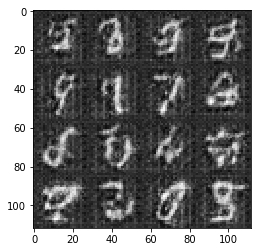

Epoch 1/2... Discriminator Loss: 0.6935... Generator Loss: 1.5052
Epoch 1/2... Discriminator Loss: 0.5512... Generator Loss: 1.9291
Epoch 1/2... Discriminator Loss: 0.9265... Generator Loss: 1.4756
Epoch 1/2... Discriminator Loss: 0.6796... Generator Loss: 1.4882
Epoch 1/2... Discriminator Loss: 1.0626... Generator Loss: 1.2115
Epoch 1/2... Discriminator Loss: 0.5528... Generator Loss: 2.0586
Epoch 1/2... Discriminator Loss: 0.8393... Generator Loss: 1.1519


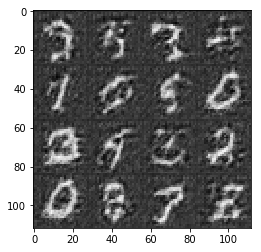

Epoch 1/2... Discriminator Loss: 0.6314... Generator Loss: 1.6277
Epoch 1/2... Discriminator Loss: 0.7265... Generator Loss: 1.3785
Epoch 1/2... Discriminator Loss: 0.9008... Generator Loss: 1.1643
Epoch 1/2... Discriminator Loss: 0.5827... Generator Loss: 2.1117
Epoch 1/2... Discriminator Loss: 0.5711... Generator Loss: 2.2695
Epoch 1/2... Discriminator Loss: 0.6666... Generator Loss: 1.8488


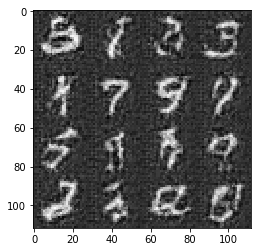

Epoch 1/2... Discriminator Loss: 0.5213... Generator Loss: 2.0707
Epoch 1/2... Discriminator Loss: 0.4711... Generator Loss: 2.5464
Epoch 1/2... Discriminator Loss: 0.7130... Generator Loss: 2.0941
Epoch 1/2... Discriminator Loss: 0.5301... Generator Loss: 2.1591
Epoch 1/2... Discriminator Loss: 0.4915... Generator Loss: 2.2554
Epoch 1/2... Discriminator Loss: 0.4338... Generator Loss: 2.7593
Epoch 1/2... Discriminator Loss: 0.6237... Generator Loss: 1.6197


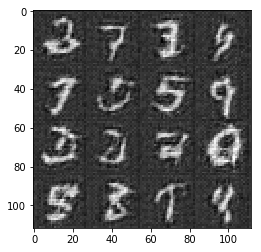

Epoch 1/2... Discriminator Loss: 0.3775... Generator Loss: 5.3530
Epoch 1/2... Discriminator Loss: 0.7869... Generator Loss: 1.3068
Epoch 1/2... Discriminator Loss: 0.9019... Generator Loss: 1.9570
Epoch 1/2... Discriminator Loss: 0.8018... Generator Loss: 1.3254
Epoch 1/2... Discriminator Loss: 0.8144... Generator Loss: 1.1634
Epoch 1/2... Discriminator Loss: 1.8450... Generator Loss: 0.3722
Epoch 1/2... Discriminator Loss: 0.6927... Generator Loss: 1.3812


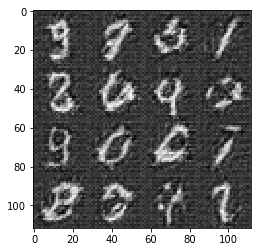

Epoch 1/2... Discriminator Loss: 0.7022... Generator Loss: 1.6195
Epoch 1/2... Discriminator Loss: 0.4212... Generator Loss: 2.8219
Epoch 1/2... Discriminator Loss: 0.8925... Generator Loss: 1.8000
Epoch 1/2... Discriminator Loss: 0.5762... Generator Loss: 2.1889
Epoch 1/2... Discriminator Loss: 0.4158... Generator Loss: 3.1090
Epoch 1/2... Discriminator Loss: 0.4280... Generator Loss: 2.6569


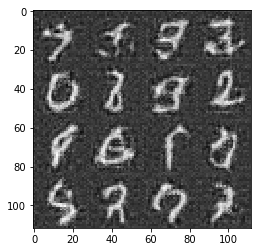

Epoch 1/2... Discriminator Loss: 0.5928... Generator Loss: 1.6620
Epoch 1/2... Discriminator Loss: 1.1254... Generator Loss: 1.0595
Epoch 1/2... Discriminator Loss: 0.8110... Generator Loss: 1.3939
Epoch 1/2... Discriminator Loss: 0.9299... Generator Loss: 1.0111
Epoch 1/2... Discriminator Loss: 0.9482... Generator Loss: 0.9472
Epoch 1/2... Discriminator Loss: 0.8717... Generator Loss: 1.0697
Epoch 1/2... Discriminator Loss: 0.7505... Generator Loss: 1.3153


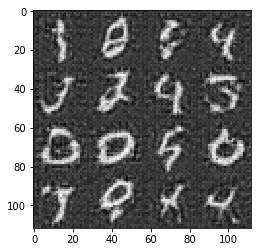

Epoch 1/2... Discriminator Loss: 0.4761... Generator Loss: 2.3527
Epoch 1/2... Discriminator Loss: 1.8742... Generator Loss: 2.9588
Epoch 1/2... Discriminator Loss: 0.6136... Generator Loss: 1.8410
Epoch 1/2... Discriminator Loss: 0.6577... Generator Loss: 1.5860
Epoch 1/2... Discriminator Loss: 0.4922... Generator Loss: 2.1588
Epoch 1/2... Discriminator Loss: 0.4832... Generator Loss: 2.2440
Epoch 1/2... Discriminator Loss: 1.1654... Generator Loss: 0.6980


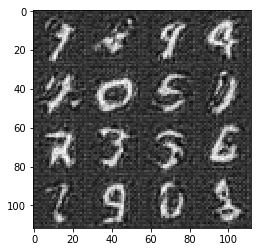

Epoch 1/2... Discriminator Loss: 0.5525... Generator Loss: 1.8383
Epoch 1/2... Discriminator Loss: 0.6241... Generator Loss: 1.7138
Epoch 1/2... Discriminator Loss: 0.5455... Generator Loss: 3.1116
Epoch 1/2... Discriminator Loss: 0.9645... Generator Loss: 2.2894
Epoch 1/2... Discriminator Loss: 1.3424... Generator Loss: 0.5846
Epoch 1/2... Discriminator Loss: 1.1163... Generator Loss: 0.7805


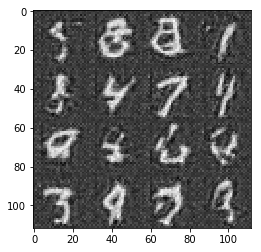

Epoch 1/2... Discriminator Loss: 0.7829... Generator Loss: 1.1781
Epoch 1/2... Discriminator Loss: 0.4418... Generator Loss: 2.8401
Epoch 1/2... Discriminator Loss: 0.5016... Generator Loss: 2.2332
Epoch 1/2... Discriminator Loss: 0.4808... Generator Loss: 2.4919
Epoch 1/2... Discriminator Loss: 0.7651... Generator Loss: 1.3200
Epoch 1/2... Discriminator Loss: 0.9828... Generator Loss: 0.9890
Epoch 1/2... Discriminator Loss: 0.5653... Generator Loss: 2.6937


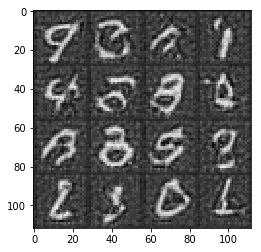

Epoch 1/2... Discriminator Loss: 0.5453... Generator Loss: 2.0583
Epoch 1/2... Discriminator Loss: 0.7295... Generator Loss: 1.5239
Epoch 1/2... Discriminator Loss: 0.6460... Generator Loss: 1.8248
Epoch 1/2... Discriminator Loss: 0.5024... Generator Loss: 2.2264
Epoch 1/2... Discriminator Loss: 0.6194... Generator Loss: 1.7056
Epoch 1/2... Discriminator Loss: 0.5215... Generator Loss: 2.1990
Epoch 1/2... Discriminator Loss: 0.9851... Generator Loss: 1.0451


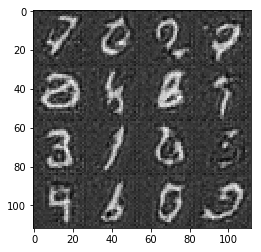

Epoch 1/2... Discriminator Loss: 0.4900... Generator Loss: 2.4133
Epoch 1/2... Discriminator Loss: 0.6778... Generator Loss: 1.5969
Epoch 1/2... Discriminator Loss: 0.9454... Generator Loss: 1.0148
Epoch 1/2... Discriminator Loss: 0.3686... Generator Loss: 4.0586
Epoch 2/2... Discriminator Loss: 0.4615... Generator Loss: 2.4399


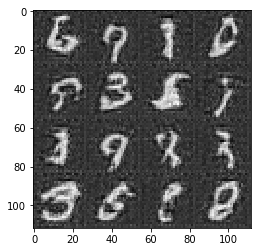

Epoch 2/2... Discriminator Loss: 0.7191... Generator Loss: 1.4266
Epoch 2/2... Discriminator Loss: 0.9121... Generator Loss: 1.2659
Epoch 2/2... Discriminator Loss: 0.5251... Generator Loss: 2.4375
Epoch 2/2... Discriminator Loss: 0.4016... Generator Loss: 3.1783
Epoch 2/2... Discriminator Loss: 3.1807... Generator Loss: 6.2228
Epoch 2/2... Discriminator Loss: 0.5637... Generator Loss: 1.8648


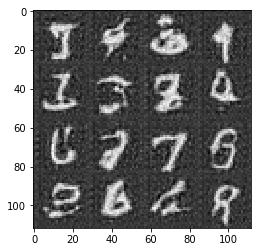

Epoch 2/2... Discriminator Loss: 0.7002... Generator Loss: 1.4628
Epoch 2/2... Discriminator Loss: 0.6170... Generator Loss: 1.6310
Epoch 2/2... Discriminator Loss: 0.5562... Generator Loss: 2.3377
Epoch 2/2... Discriminator Loss: 0.6903... Generator Loss: 1.5438
Epoch 2/2... Discriminator Loss: 0.4866... Generator Loss: 2.3344
Epoch 2/2... Discriminator Loss: 0.4925... Generator Loss: 2.2715
Epoch 2/2... Discriminator Loss: 0.3707... Generator Loss: 3.6315


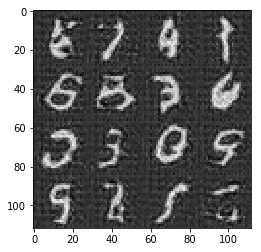

Epoch 2/2... Discriminator Loss: 3.3317... Generator Loss: 0.1396
Epoch 2/2... Discriminator Loss: 1.2050... Generator Loss: 0.8149
Epoch 2/2... Discriminator Loss: 0.5416... Generator Loss: 2.0846
Epoch 2/2... Discriminator Loss: 0.6236... Generator Loss: 1.5882
Epoch 2/2... Discriminator Loss: 2.2649... Generator Loss: 0.2895
Epoch 2/2... Discriminator Loss: 0.8304... Generator Loss: 2.5289
Epoch 2/2... Discriminator Loss: 0.8086... Generator Loss: 1.1435


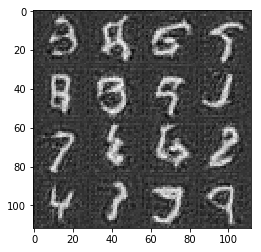

Epoch 2/2... Discriminator Loss: 0.5109... Generator Loss: 1.9925
Epoch 2/2... Discriminator Loss: 0.4837... Generator Loss: 2.4926
Epoch 2/2... Discriminator Loss: 0.5164... Generator Loss: 2.1752
Epoch 2/2... Discriminator Loss: 0.5457... Generator Loss: 2.1028
Epoch 2/2... Discriminator Loss: 0.3850... Generator Loss: 3.3312
Epoch 2/2... Discriminator Loss: 0.4125... Generator Loss: 2.9554


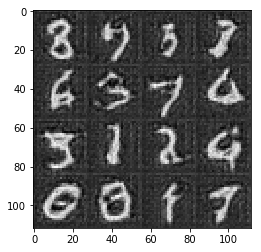

Epoch 2/2... Discriminator Loss: 1.0051... Generator Loss: 1.1553
Epoch 2/2... Discriminator Loss: 0.6431... Generator Loss: 1.9883
Epoch 2/2... Discriminator Loss: 1.2523... Generator Loss: 0.8768
Epoch 2/2... Discriminator Loss: 0.5208... Generator Loss: 1.9883
Epoch 2/2... Discriminator Loss: 0.5236... Generator Loss: 2.1517
Epoch 2/2... Discriminator Loss: 0.8606... Generator Loss: 1.0681
Epoch 2/2... Discriminator Loss: 1.0504... Generator Loss: 0.9349


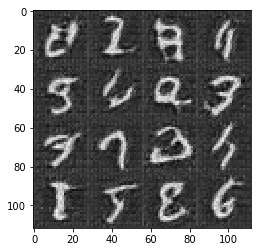

Epoch 2/2... Discriminator Loss: 0.7257... Generator Loss: 1.9608
Epoch 2/2... Discriminator Loss: 0.9372... Generator Loss: 0.9931
Epoch 2/2... Discriminator Loss: 0.9395... Generator Loss: 1.0771
Epoch 2/2... Discriminator Loss: 0.9367... Generator Loss: 0.9825
Epoch 2/2... Discriminator Loss: 0.6510... Generator Loss: 1.5861
Epoch 2/2... Discriminator Loss: 1.2885... Generator Loss: 0.6902
Epoch 2/2... Discriminator Loss: 1.8148... Generator Loss: 0.4128


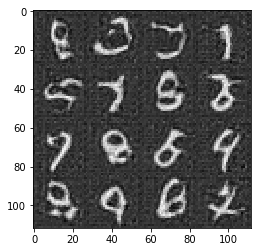

Epoch 2/2... Discriminator Loss: 0.5075... Generator Loss: 2.2255
Epoch 2/2... Discriminator Loss: 0.5062... Generator Loss: 2.1641
Epoch 2/2... Discriminator Loss: 0.5516... Generator Loss: 1.9067
Epoch 2/2... Discriminator Loss: 0.4256... Generator Loss: 2.7826
Epoch 2/2... Discriminator Loss: 0.4173... Generator Loss: 2.9327
Epoch 2/2... Discriminator Loss: 0.7284... Generator Loss: 1.2810


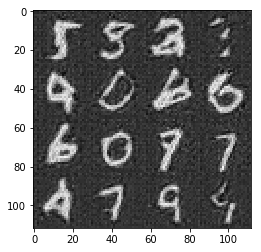

Epoch 2/2... Discriminator Loss: 0.6723... Generator Loss: 1.4486
Epoch 2/2... Discriminator Loss: 0.4356... Generator Loss: 2.7166
Epoch 2/2... Discriminator Loss: 0.5496... Generator Loss: 1.8790
Epoch 2/2... Discriminator Loss: 0.5449... Generator Loss: 2.4436
Epoch 2/2... Discriminator Loss: 1.6721... Generator Loss: 0.4302
Epoch 2/2... Discriminator Loss: 0.5439... Generator Loss: 2.2367
Epoch 2/2... Discriminator Loss: 0.9280... Generator Loss: 0.9885


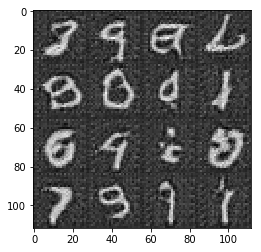

Epoch 2/2... Discriminator Loss: 0.5588... Generator Loss: 2.6749
Epoch 2/2... Discriminator Loss: 0.6599... Generator Loss: 1.4883
Epoch 2/2... Discriminator Loss: 0.5219... Generator Loss: 2.5393
Epoch 2/2... Discriminator Loss: 0.6215... Generator Loss: 1.7457
Epoch 2/2... Discriminator Loss: 0.7627... Generator Loss: 1.9004
Epoch 2/2... Discriminator Loss: 0.5512... Generator Loss: 1.8826
Epoch 2/2... Discriminator Loss: 0.6554... Generator Loss: 1.6894


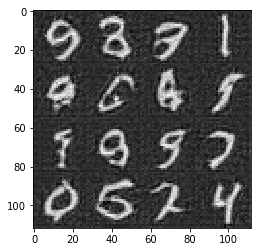

Epoch 2/2... Discriminator Loss: 1.3008... Generator Loss: 0.5430
Epoch 2/2... Discriminator Loss: 0.6122... Generator Loss: 1.6271
Epoch 2/2... Discriminator Loss: 0.4319... Generator Loss: 4.2272
Epoch 2/2... Discriminator Loss: 0.5138... Generator Loss: 2.2547
Epoch 2/2... Discriminator Loss: 0.3799... Generator Loss: 3.5476
Epoch 2/2... Discriminator Loss: 0.5858... Generator Loss: 1.9428


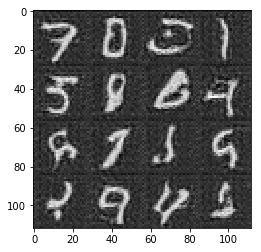

Epoch 2/2... Discriminator Loss: 0.4574... Generator Loss: 2.5179
Epoch 2/2... Discriminator Loss: 0.4012... Generator Loss: 3.0773
Epoch 2/2... Discriminator Loss: 0.9324... Generator Loss: 0.9953
Epoch 2/2... Discriminator Loss: 0.7375... Generator Loss: 1.4914
Epoch 2/2... Discriminator Loss: 0.7319... Generator Loss: 1.5445
Epoch 2/2... Discriminator Loss: 0.6382... Generator Loss: 1.5716
Epoch 2/2... Discriminator Loss: 0.5759... Generator Loss: 1.7834


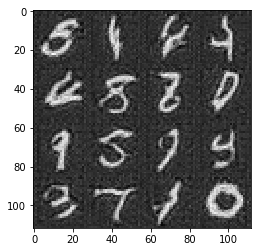

Epoch 2/2... Discriminator Loss: 0.4804... Generator Loss: 2.4735
Epoch 2/2... Discriminator Loss: 1.0699... Generator Loss: 3.7001
Epoch 2/2... Discriminator Loss: 1.8928... Generator Loss: 0.3651
Epoch 2/2... Discriminator Loss: 0.5850... Generator Loss: 1.7771
Epoch 2/2... Discriminator Loss: 0.4707... Generator Loss: 2.3810
Epoch 2/2... Discriminator Loss: 0.4350... Generator Loss: 2.6638
Epoch 2/2... Discriminator Loss: 0.8577... Generator Loss: 1.3318


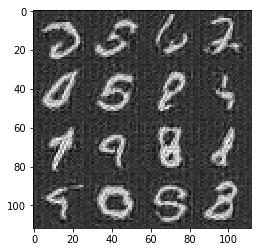

Epoch 2/2... Discriminator Loss: 0.8851... Generator Loss: 1.1560
Epoch 2/2... Discriminator Loss: 0.9710... Generator Loss: 0.8637
Epoch 2/2... Discriminator Loss: 0.7367... Generator Loss: 1.4381
Epoch 2/2... Discriminator Loss: 0.5403... Generator Loss: 2.2249
Epoch 2/2... Discriminator Loss: 0.6546... Generator Loss: 1.6964
Epoch 2/2... Discriminator Loss: 1.1309... Generator Loss: 0.7750


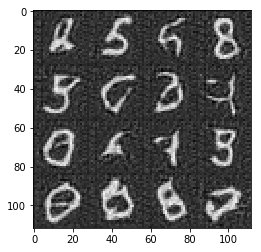

Epoch 2/2... Discriminator Loss: 0.6993... Generator Loss: 1.8140
Epoch 2/2... Discriminator Loss: 1.3143... Generator Loss: 0.7148
Epoch 2/2... Discriminator Loss: 0.7194... Generator Loss: 1.9465
Epoch 2/2... Discriminator Loss: 0.7110... Generator Loss: 1.6444
Epoch 2/2... Discriminator Loss: 0.8580... Generator Loss: 3.0253
Epoch 2/2... Discriminator Loss: 0.7299... Generator Loss: 1.3850
Epoch 2/2... Discriminator Loss: 0.7456... Generator Loss: 1.3017


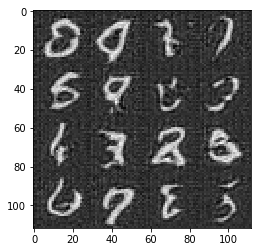

Epoch 2/2... Discriminator Loss: 0.3888... Generator Loss: 3.9246
Epoch 2/2... Discriminator Loss: 0.6212... Generator Loss: 1.7640
Epoch 2/2... Discriminator Loss: 0.5982... Generator Loss: 1.6905
Epoch 2/2... Discriminator Loss: 0.4396... Generator Loss: 2.7153
Epoch 2/2... Discriminator Loss: 0.8241... Generator Loss: 1.3991
Epoch 2/2... Discriminator Loss: 0.7675... Generator Loss: 1.2354
Epoch 2/2... Discriminator Loss: 0.6825... Generator Loss: 1.5390


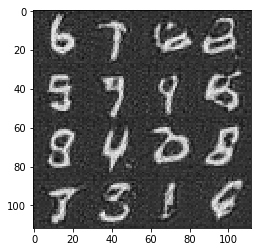

Epoch 2/2... Discriminator Loss: 0.4827... Generator Loss: 2.6631
Epoch 2/2... Discriminator Loss: 0.4917... Generator Loss: 2.2679
Epoch 2/2... Discriminator Loss: 0.4895... Generator Loss: 2.3937
Epoch 2/2... Discriminator Loss: 0.6607... Generator Loss: 1.5858
Epoch 2/2... Discriminator Loss: 0.6270... Generator Loss: 1.6087
Epoch 2/2... Discriminator Loss: 0.6740... Generator Loss: 1.6476


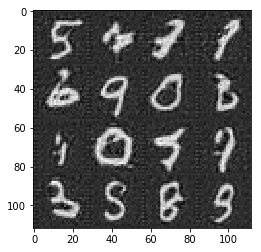

Epoch 2/2... Discriminator Loss: 0.5644... Generator Loss: 1.8869
Epoch 2/2... Discriminator Loss: 0.6345... Generator Loss: 1.6452
Epoch 2/2... Discriminator Loss: 1.1389... Generator Loss: 0.8075
Epoch 2/2... Discriminator Loss: 0.5976... Generator Loss: 1.7525
Epoch 2/2... Discriminator Loss: 0.5904... Generator Loss: 1.7632
Epoch 2/2... Discriminator Loss: 2.4082... Generator Loss: 0.2268
Epoch 2/2... Discriminator Loss: 1.4713... Generator Loss: 0.4683


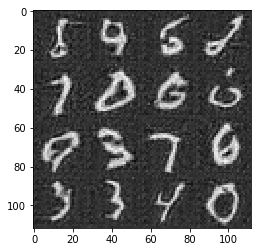

Epoch 2/2... Discriminator Loss: 0.7192... Generator Loss: 1.4496
Epoch 2/2... Discriminator Loss: 0.6371... Generator Loss: 1.5864
Epoch 2/2... Discriminator Loss: 0.7702... Generator Loss: 4.1016
Epoch 2/2... Discriminator Loss: 0.6925... Generator Loss: 1.6330
Epoch 2/2... Discriminator Loss: 0.9844... Generator Loss: 1.0188
Epoch 2/2... Discriminator Loss: 1.0119... Generator Loss: 0.9111
Epoch 2/2... Discriminator Loss: 0.6635... Generator Loss: 1.6701


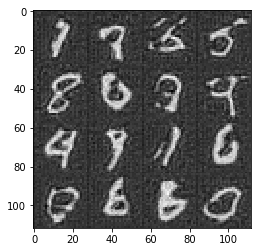

Epoch 2/2... Discriminator Loss: 0.5052... Generator Loss: 2.3522
Epoch 2/2... Discriminator Loss: 0.5147... Generator Loss: 1.9723
Epoch 2/2... Discriminator Loss: 0.6644... Generator Loss: 1.5957
Epoch 2/2... Discriminator Loss: 0.5939... Generator Loss: 1.7337


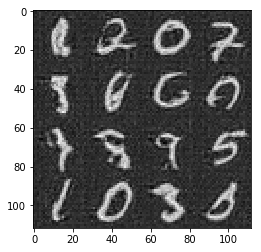

Last train discriminator Loss: 0.5939
Last train generator Loss: 1.7337


In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

Epoch 1/5... Discriminator Loss: 1.8515... Generator Loss: 0.4383


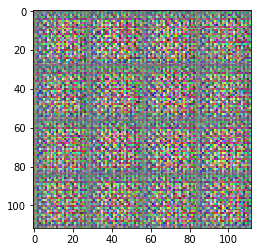

Epoch 1/5... Discriminator Loss: 0.4546... Generator Loss: 5.6315
Epoch 1/5... Discriminator Loss: 1.4435... Generator Loss: 0.7343
Epoch 1/5... Discriminator Loss: 3.1022... Generator Loss: 5.8028
Epoch 1/5... Discriminator Loss: 0.5833... Generator Loss: 3.1203
Epoch 1/5... Discriminator Loss: 0.5753... Generator Loss: 2.2878
Epoch 1/5... Discriminator Loss: 0.4176... Generator Loss: 4.2903


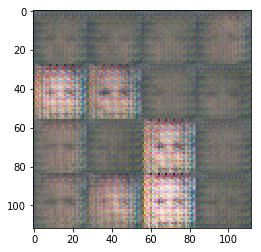

Epoch 1/5... Discriminator Loss: 0.4601... Generator Loss: 3.2981
Epoch 1/5... Discriminator Loss: 0.9756... Generator Loss: 4.3900
Epoch 1/5... Discriminator Loss: 0.8993... Generator Loss: 1.0904
Epoch 1/5... Discriminator Loss: 1.0683... Generator Loss: 1.3812
Epoch 1/5... Discriminator Loss: 1.7274... Generator Loss: 3.2822
Epoch 1/5... Discriminator Loss: 0.7556... Generator Loss: 1.9846
Epoch 1/5... Discriminator Loss: 0.8181... Generator Loss: 1.3469


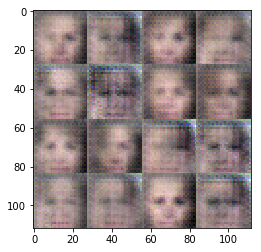

Epoch 1/5... Discriminator Loss: 1.1002... Generator Loss: 0.8497
Epoch 1/5... Discriminator Loss: 1.7868... Generator Loss: 2.7915
Epoch 1/5... Discriminator Loss: 1.7918... Generator Loss: 0.5151
Epoch 1/5... Discriminator Loss: 1.7124... Generator Loss: 0.7004
Epoch 1/5... Discriminator Loss: 1.3044... Generator Loss: 0.9582
Epoch 1/5... Discriminator Loss: 1.1625... Generator Loss: 1.2060
Epoch 1/5... Discriminator Loss: 1.4247... Generator Loss: 0.4641


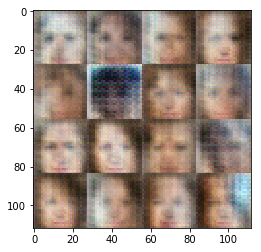

Epoch 1/5... Discriminator Loss: 0.8300... Generator Loss: 1.2320
Epoch 1/5... Discriminator Loss: 0.9611... Generator Loss: 1.1705
Epoch 1/5... Discriminator Loss: 1.5196... Generator Loss: 0.7575
Epoch 1/5... Discriminator Loss: 0.9020... Generator Loss: 1.1862
Epoch 1/5... Discriminator Loss: 1.2761... Generator Loss: 0.5787
Epoch 1/5... Discriminator Loss: 1.5098... Generator Loss: 0.7489


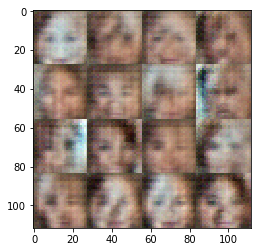

Epoch 1/5... Discriminator Loss: 2.3410... Generator Loss: 2.3646
Epoch 1/5... Discriminator Loss: 2.1594... Generator Loss: 0.3515
Epoch 1/5... Discriminator Loss: 1.1135... Generator Loss: 0.9384
Epoch 1/5... Discriminator Loss: 0.9508... Generator Loss: 0.8794
Epoch 1/5... Discriminator Loss: 1.2615... Generator Loss: 0.8886
Epoch 1/5... Discriminator Loss: 1.1324... Generator Loss: 1.7264
Epoch 1/5... Discriminator Loss: 1.7076... Generator Loss: 0.4975


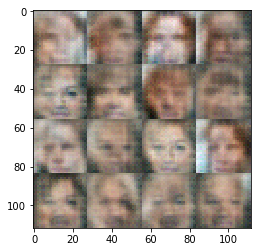

Epoch 1/5... Discriminator Loss: 0.9004... Generator Loss: 1.2186
Epoch 1/5... Discriminator Loss: 1.5429... Generator Loss: 0.5727
Epoch 1/5... Discriminator Loss: 2.6983... Generator Loss: 0.1455
Epoch 1/5... Discriminator Loss: 1.1318... Generator Loss: 0.8769
Epoch 1/5... Discriminator Loss: 1.1913... Generator Loss: 0.8554
Epoch 1/5... Discriminator Loss: 0.9923... Generator Loss: 1.2176
Epoch 1/5... Discriminator Loss: 1.2745... Generator Loss: 0.8341


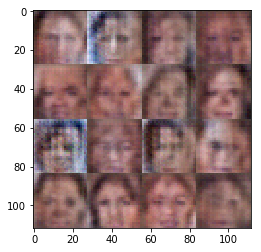

Epoch 1/5... Discriminator Loss: 1.1144... Generator Loss: 0.8441
Epoch 1/5... Discriminator Loss: 1.1355... Generator Loss: 0.7671
Epoch 1/5... Discriminator Loss: 1.6074... Generator Loss: 0.4749
Epoch 1/5... Discriminator Loss: 1.2037... Generator Loss: 1.0632
Epoch 1/5... Discriminator Loss: 1.2810... Generator Loss: 0.8753
Epoch 1/5... Discriminator Loss: 1.4173... Generator Loss: 0.8215


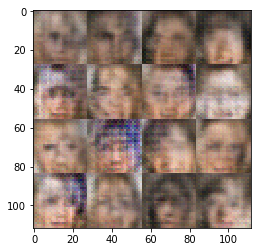

Epoch 1/5... Discriminator Loss: 1.4560... Generator Loss: 1.3507
Epoch 1/5... Discriminator Loss: 1.4670... Generator Loss: 0.7031
Epoch 1/5... Discriminator Loss: 1.4802... Generator Loss: 0.4876
Epoch 1/5... Discriminator Loss: 1.1125... Generator Loss: 0.9071
Epoch 1/5... Discriminator Loss: 1.2151... Generator Loss: 0.9904
Epoch 1/5... Discriminator Loss: 1.3764... Generator Loss: 0.6110
Epoch 1/5... Discriminator Loss: 1.2273... Generator Loss: 0.8626


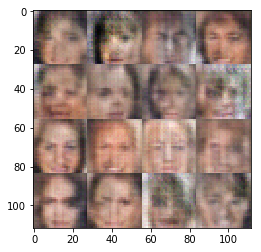

Epoch 1/5... Discriminator Loss: 1.2053... Generator Loss: 0.7351
Epoch 1/5... Discriminator Loss: 1.2831... Generator Loss: 1.0964
Epoch 1/5... Discriminator Loss: 1.1423... Generator Loss: 1.0135
Epoch 1/5... Discriminator Loss: 1.7065... Generator Loss: 0.3749
Epoch 1/5... Discriminator Loss: 0.9981... Generator Loss: 0.9549
Epoch 1/5... Discriminator Loss: 1.3652... Generator Loss: 0.5291
Epoch 1/5... Discriminator Loss: 1.2892... Generator Loss: 0.9193


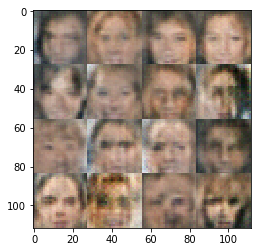

Epoch 1/5... Discriminator Loss: 1.1318... Generator Loss: 1.3424
Epoch 1/5... Discriminator Loss: 1.2334... Generator Loss: 0.8106
Epoch 1/5... Discriminator Loss: 1.3964... Generator Loss: 0.8851
Epoch 1/5... Discriminator Loss: 1.4549... Generator Loss: 1.4287
Epoch 1/5... Discriminator Loss: 1.2059... Generator Loss: 0.8697
Epoch 1/5... Discriminator Loss: 1.1559... Generator Loss: 0.8085


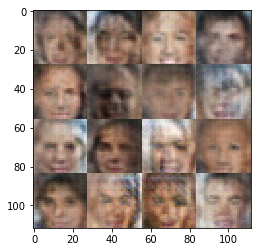

Epoch 1/5... Discriminator Loss: 1.0818... Generator Loss: 0.9448
Epoch 1/5... Discriminator Loss: 1.1729... Generator Loss: 1.0513
Epoch 1/5... Discriminator Loss: 1.0848... Generator Loss: 1.0863
Epoch 1/5... Discriminator Loss: 1.5568... Generator Loss: 0.5516
Epoch 1/5... Discriminator Loss: 1.2394... Generator Loss: 0.6189
Epoch 1/5... Discriminator Loss: 1.1885... Generator Loss: 0.9133
Epoch 1/5... Discriminator Loss: 1.2394... Generator Loss: 0.6194


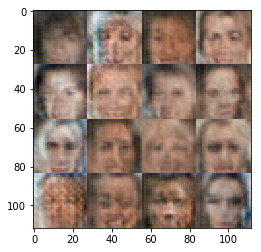

Epoch 1/5... Discriminator Loss: 1.1459... Generator Loss: 0.8174
Epoch 1/5... Discriminator Loss: 1.1202... Generator Loss: 0.9293
Epoch 1/5... Discriminator Loss: 1.1962... Generator Loss: 1.3033
Epoch 1/5... Discriminator Loss: 1.4134... Generator Loss: 0.5321
Epoch 1/5... Discriminator Loss: 2.6182... Generator Loss: 3.1560
Epoch 1/5... Discriminator Loss: 1.2706... Generator Loss: 0.6695
Epoch 1/5... Discriminator Loss: 1.2135... Generator Loss: 0.6828


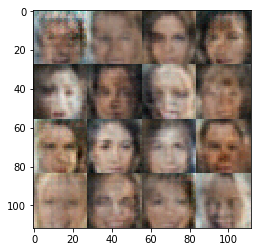

Epoch 1/5... Discriminator Loss: 1.2829... Generator Loss: 0.6157
Epoch 1/5... Discriminator Loss: 1.4419... Generator Loss: 0.4697
Epoch 1/5... Discriminator Loss: 1.1750... Generator Loss: 0.9872
Epoch 1/5... Discriminator Loss: 0.9939... Generator Loss: 1.2048
Epoch 1/5... Discriminator Loss: 1.6569... Generator Loss: 0.3879
Epoch 1/5... Discriminator Loss: 1.2364... Generator Loss: 0.9584


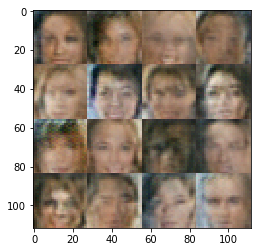

Epoch 1/5... Discriminator Loss: 1.2014... Generator Loss: 0.9104
Epoch 1/5... Discriminator Loss: 1.3261... Generator Loss: 0.6088
Epoch 1/5... Discriminator Loss: 1.1502... Generator Loss: 1.0080
Epoch 1/5... Discriminator Loss: 1.6183... Generator Loss: 0.3730
Epoch 1/5... Discriminator Loss: 1.2932... Generator Loss: 1.0171
Epoch 1/5... Discriminator Loss: 1.9911... Generator Loss: 0.2748
Epoch 1/5... Discriminator Loss: 1.0887... Generator Loss: 1.1839


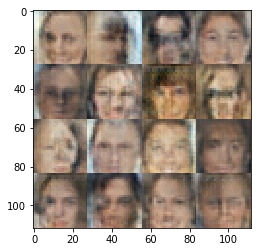

Epoch 1/5... Discriminator Loss: 1.3040... Generator Loss: 0.9144
Epoch 1/5... Discriminator Loss: 1.0450... Generator Loss: 1.0044
Epoch 1/5... Discriminator Loss: 1.0402... Generator Loss: 1.6035
Epoch 1/5... Discriminator Loss: 1.1033... Generator Loss: 1.6949
Epoch 1/5... Discriminator Loss: 1.0165... Generator Loss: 1.3169
Epoch 1/5... Discriminator Loss: 1.2030... Generator Loss: 0.9927
Epoch 1/5... Discriminator Loss: 1.3393... Generator Loss: 0.9462


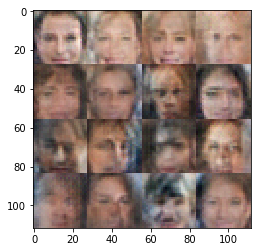

Epoch 1/5... Discriminator Loss: 1.2379... Generator Loss: 0.6478
Epoch 1/5... Discriminator Loss: 1.2734... Generator Loss: 1.3646
Epoch 1/5... Discriminator Loss: 1.2040... Generator Loss: 0.6201
Epoch 1/5... Discriminator Loss: 1.0698... Generator Loss: 0.9191
Epoch 1/5... Discriminator Loss: 1.0929... Generator Loss: 0.7943
Epoch 1/5... Discriminator Loss: 1.1717... Generator Loss: 0.8564


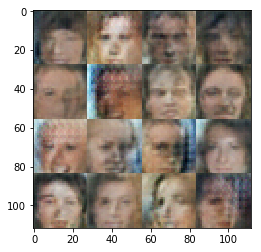

Epoch 1/5... Discriminator Loss: 1.2928... Generator Loss: 0.5842
Epoch 1/5... Discriminator Loss: 1.1254... Generator Loss: 1.0481
Epoch 1/5... Discriminator Loss: 1.1577... Generator Loss: 0.8743
Epoch 1/5... Discriminator Loss: 1.2373... Generator Loss: 0.9428
Epoch 1/5... Discriminator Loss: 1.1618... Generator Loss: 1.0265
Epoch 1/5... Discriminator Loss: 1.0821... Generator Loss: 0.8947
Epoch 1/5... Discriminator Loss: 1.9943... Generator Loss: 0.2518


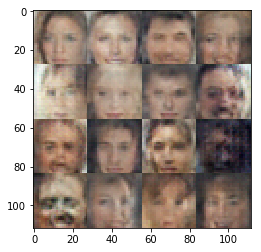

Epoch 1/5... Discriminator Loss: 1.5882... Generator Loss: 0.4629
Epoch 1/5... Discriminator Loss: 1.1119... Generator Loss: 1.0004
Epoch 1/5... Discriminator Loss: 1.0953... Generator Loss: 0.7699
Epoch 1/5... Discriminator Loss: 1.4721... Generator Loss: 0.4769
Epoch 1/5... Discriminator Loss: 1.0580... Generator Loss: 1.4267
Epoch 1/5... Discriminator Loss: 1.0226... Generator Loss: 1.0283
Epoch 1/5... Discriminator Loss: 1.1623... Generator Loss: 0.8413


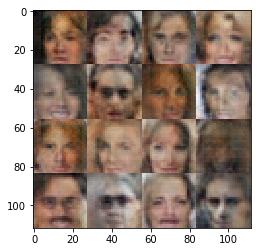

Epoch 1/5... Discriminator Loss: 1.1718... Generator Loss: 1.1005
Epoch 1/5... Discriminator Loss: 1.0725... Generator Loss: 0.8664
Epoch 1/5... Discriminator Loss: 1.2612... Generator Loss: 0.6253
Epoch 1/5... Discriminator Loss: 1.2479... Generator Loss: 0.5925
Epoch 1/5... Discriminator Loss: 1.3849... Generator Loss: 0.4954
Epoch 1/5... Discriminator Loss: 1.3066... Generator Loss: 0.6743


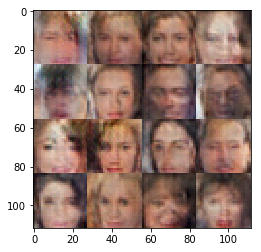

Epoch 1/5... Discriminator Loss: 0.9830... Generator Loss: 1.2936
Epoch 1/5... Discriminator Loss: 1.2045... Generator Loss: 1.0711
Epoch 1/5... Discriminator Loss: 1.3889... Generator Loss: 1.4695
Epoch 1/5... Discriminator Loss: 1.3198... Generator Loss: 0.5971
Epoch 1/5... Discriminator Loss: 1.0329... Generator Loss: 1.0570
Epoch 1/5... Discriminator Loss: 1.1079... Generator Loss: 1.0139
Epoch 1/5... Discriminator Loss: 1.1061... Generator Loss: 0.8897


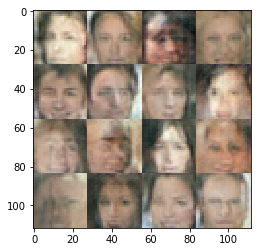

Epoch 1/5... Discriminator Loss: 1.0712... Generator Loss: 0.8790
Epoch 1/5... Discriminator Loss: 1.1080... Generator Loss: 0.8855
Epoch 1/5... Discriminator Loss: 1.0195... Generator Loss: 0.9472
Epoch 1/5... Discriminator Loss: 1.3901... Generator Loss: 0.6498
Epoch 1/5... Discriminator Loss: 1.2194... Generator Loss: 0.9117
Epoch 1/5... Discriminator Loss: 1.1486... Generator Loss: 1.0360
Epoch 1/5... Discriminator Loss: 1.0578... Generator Loss: 1.3542


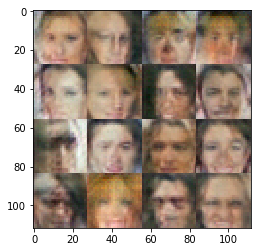

Epoch 1/5... Discriminator Loss: 1.0771... Generator Loss: 0.8629
Epoch 1/5... Discriminator Loss: 1.3146... Generator Loss: 0.5646
Epoch 1/5... Discriminator Loss: 1.2540... Generator Loss: 1.3986
Epoch 1/5... Discriminator Loss: 1.0604... Generator Loss: 0.9891
Epoch 1/5... Discriminator Loss: 0.9501... Generator Loss: 1.5778
Epoch 1/5... Discriminator Loss: 1.4468... Generator Loss: 0.7005


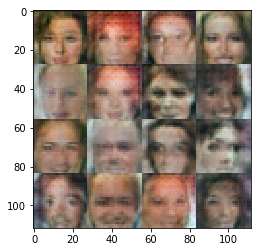

Epoch 1/5... Discriminator Loss: 1.0568... Generator Loss: 1.0411
Epoch 1/5... Discriminator Loss: 1.1932... Generator Loss: 0.9465
Epoch 1/5... Discriminator Loss: 1.1283... Generator Loss: 0.7867
Epoch 1/5... Discriminator Loss: 1.2168... Generator Loss: 1.1382
Epoch 1/5... Discriminator Loss: 1.2553... Generator Loss: 1.6534
Epoch 1/5... Discriminator Loss: 1.2669... Generator Loss: 1.4291
Epoch 1/5... Discriminator Loss: 1.2386... Generator Loss: 1.2142


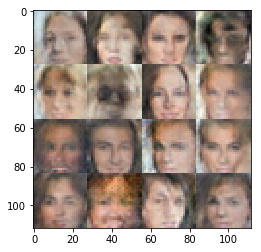

Epoch 1/5... Discriminator Loss: 1.3853... Generator Loss: 0.5245
Epoch 1/5... Discriminator Loss: 1.6044... Generator Loss: 0.3882
Epoch 1/5... Discriminator Loss: 1.0471... Generator Loss: 0.8858
Epoch 1/5... Discriminator Loss: 1.3400... Generator Loss: 0.5622
Epoch 1/5... Discriminator Loss: 1.0733... Generator Loss: 1.0690
Epoch 1/5... Discriminator Loss: 1.0078... Generator Loss: 1.0329
Epoch 1/5... Discriminator Loss: 1.2302... Generator Loss: 0.7884


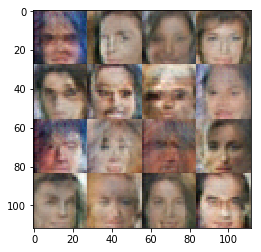

Epoch 1/5... Discriminator Loss: 1.3651... Generator Loss: 0.5475
Epoch 1/5... Discriminator Loss: 1.1190... Generator Loss: 0.9754
Epoch 1/5... Discriminator Loss: 1.2040... Generator Loss: 1.0969
Epoch 1/5... Discriminator Loss: 1.2825... Generator Loss: 0.9731
Epoch 1/5... Discriminator Loss: 1.0339... Generator Loss: 1.0072
Epoch 1/5... Discriminator Loss: 1.1969... Generator Loss: 0.9851


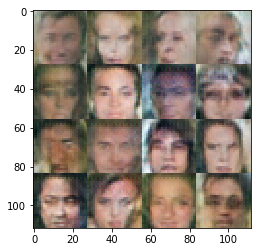

Epoch 1/5... Discriminator Loss: 1.0538... Generator Loss: 1.1165
Epoch 1/5... Discriminator Loss: 0.9559... Generator Loss: 1.2154
Epoch 1/5... Discriminator Loss: 1.1146... Generator Loss: 0.8523
Epoch 1/5... Discriminator Loss: 1.2542... Generator Loss: 0.6584
Epoch 1/5... Discriminator Loss: 1.0506... Generator Loss: 1.0020
Epoch 1/5... Discriminator Loss: 1.0914... Generator Loss: 0.8736
Epoch 1/5... Discriminator Loss: 1.0097... Generator Loss: 1.5352


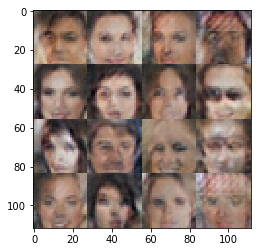

Epoch 1/5... Discriminator Loss: 1.2418... Generator Loss: 0.7016
Epoch 1/5... Discriminator Loss: 1.3493... Generator Loss: 0.5545
Epoch 1/5... Discriminator Loss: 1.1182... Generator Loss: 0.7766
Epoch 1/5... Discriminator Loss: 1.6998... Generator Loss: 0.3486
Epoch 1/5... Discriminator Loss: 1.1166... Generator Loss: 0.8987
Epoch 1/5... Discriminator Loss: 1.0794... Generator Loss: 0.8703
Epoch 1/5... Discriminator Loss: 1.2641... Generator Loss: 0.6690


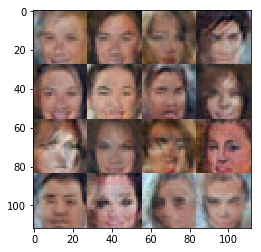

Epoch 1/5... Discriminator Loss: 1.1424... Generator Loss: 0.8392
Epoch 1/5... Discriminator Loss: 1.0995... Generator Loss: 0.9367
Epoch 1/5... Discriminator Loss: 1.0818... Generator Loss: 1.3377
Epoch 1/5... Discriminator Loss: 1.2155... Generator Loss: 0.6798
Epoch 1/5... Discriminator Loss: 1.3016... Generator Loss: 0.5979
Epoch 1/5... Discriminator Loss: 1.0640... Generator Loss: 0.8311


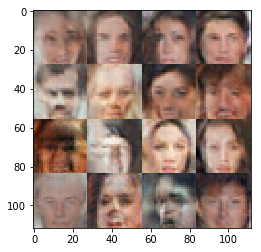

Epoch 1/5... Discriminator Loss: 1.2390... Generator Loss: 0.7130
Epoch 1/5... Discriminator Loss: 1.2210... Generator Loss: 1.3191
Epoch 1/5... Discriminator Loss: 1.6019... Generator Loss: 0.4016
Epoch 1/5... Discriminator Loss: 1.4073... Generator Loss: 0.5783
Epoch 1/5... Discriminator Loss: 1.2128... Generator Loss: 0.8677
Epoch 1/5... Discriminator Loss: 1.2172... Generator Loss: 0.8905
Epoch 1/5... Discriminator Loss: 1.1203... Generator Loss: 1.4945


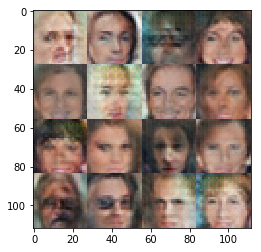

Epoch 1/5... Discriminator Loss: 1.2285... Generator Loss: 0.6232
Epoch 1/5... Discriminator Loss: 1.2957... Generator Loss: 0.5881
Epoch 1/5... Discriminator Loss: 1.1036... Generator Loss: 0.9317
Epoch 1/5... Discriminator Loss: 1.3634... Generator Loss: 0.6319
Epoch 1/5... Discriminator Loss: 1.3435... Generator Loss: 0.6701
Epoch 1/5... Discriminator Loss: 1.1600... Generator Loss: 1.0301
Epoch 1/5... Discriminator Loss: 1.1599... Generator Loss: 0.7351


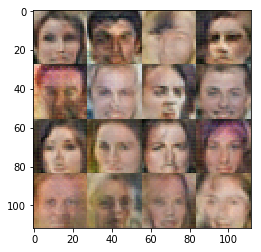

Epoch 1/5... Discriminator Loss: 1.2481... Generator Loss: 0.9429
Epoch 1/5... Discriminator Loss: 1.2251... Generator Loss: 0.8804
Epoch 1/5... Discriminator Loss: 1.3328... Generator Loss: 0.6496
Epoch 1/5... Discriminator Loss: 1.1647... Generator Loss: 0.8488
Epoch 1/5... Discriminator Loss: 1.1935... Generator Loss: 1.1707
Epoch 1/5... Discriminator Loss: 1.0827... Generator Loss: 1.3499


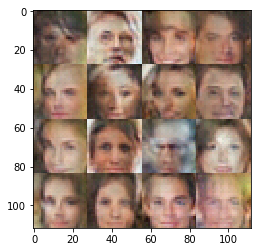

Epoch 1/5... Discriminator Loss: 1.3743... Generator Loss: 0.5376
Epoch 1/5... Discriminator Loss: 1.1254... Generator Loss: 1.2957
Epoch 1/5... Discriminator Loss: 1.1497... Generator Loss: 0.6846
Epoch 1/5... Discriminator Loss: 1.0465... Generator Loss: 1.3708
Epoch 1/5... Discriminator Loss: 1.2047... Generator Loss: 0.7017
Epoch 1/5... Discriminator Loss: 1.5394... Generator Loss: 0.4102
Epoch 1/5... Discriminator Loss: 1.1933... Generator Loss: 1.0884


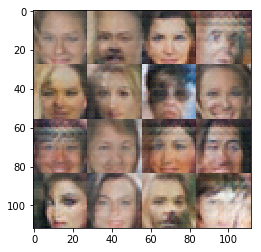

Epoch 1/5... Discriminator Loss: 1.1959... Generator Loss: 0.8899
Epoch 1/5... Discriminator Loss: 1.0563... Generator Loss: 1.1183
Epoch 1/5... Discriminator Loss: 1.1337... Generator Loss: 0.8609
Epoch 1/5... Discriminator Loss: 1.0709... Generator Loss: 1.2268
Epoch 1/5... Discriminator Loss: 1.1928... Generator Loss: 0.7530
Epoch 1/5... Discriminator Loss: 1.0790... Generator Loss: 1.0869
Epoch 1/5... Discriminator Loss: 0.7887... Generator Loss: 1.4066


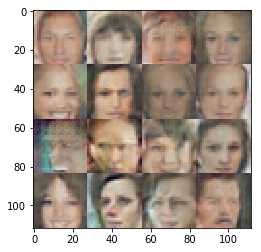

Epoch 1/5... Discriminator Loss: 1.2860... Generator Loss: 0.5787
Epoch 1/5... Discriminator Loss: 1.2160... Generator Loss: 0.7258
Epoch 1/5... Discriminator Loss: 0.9808... Generator Loss: 0.9673
Epoch 1/5... Discriminator Loss: 1.1403... Generator Loss: 1.0289
Epoch 1/5... Discriminator Loss: 0.9961... Generator Loss: 1.1125
Epoch 1/5... Discriminator Loss: 1.6215... Generator Loss: 0.4083


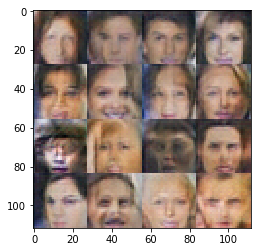

Epoch 1/5... Discriminator Loss: 1.3515... Generator Loss: 0.7816
Epoch 1/5... Discriminator Loss: 1.4297... Generator Loss: 0.4523
Epoch 1/5... Discriminator Loss: 1.1983... Generator Loss: 0.7697
Epoch 1/5... Discriminator Loss: 1.0817... Generator Loss: 1.5910
Epoch 1/5... Discriminator Loss: 1.0241... Generator Loss: 1.4181
Epoch 1/5... Discriminator Loss: 1.1662... Generator Loss: 0.8675
Epoch 1/5... Discriminator Loss: 1.2974... Generator Loss: 0.6170


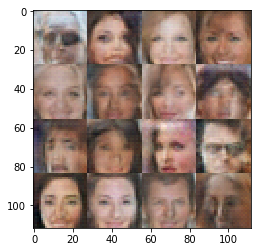

Epoch 1/5... Discriminator Loss: 1.7047... Generator Loss: 0.3635
Epoch 1/5... Discriminator Loss: 1.3196... Generator Loss: 0.7225
Epoch 1/5... Discriminator Loss: 1.1889... Generator Loss: 0.8679
Epoch 1/5... Discriminator Loss: 1.1631... Generator Loss: 0.7055
Epoch 1/5... Discriminator Loss: 1.3496... Generator Loss: 0.6310
Epoch 1/5... Discriminator Loss: 1.3880... Generator Loss: 0.5591
Epoch 1/5... Discriminator Loss: 1.0581... Generator Loss: 0.8408


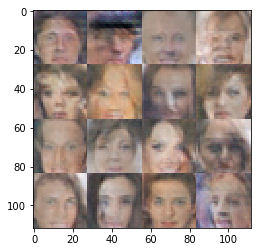

Epoch 1/5... Discriminator Loss: 1.2220... Generator Loss: 1.0217
Epoch 1/5... Discriminator Loss: 1.2901... Generator Loss: 0.6268
Epoch 1/5... Discriminator Loss: 1.0463... Generator Loss: 0.8536
Epoch 1/5... Discriminator Loss: 1.1524... Generator Loss: 0.9804
Epoch 1/5... Discriminator Loss: 1.5124... Generator Loss: 0.4333
Epoch 1/5... Discriminator Loss: 1.1550... Generator Loss: 1.1966


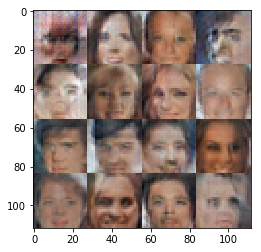

Epoch 1/5... Discriminator Loss: 0.9629... Generator Loss: 1.2651
Epoch 1/5... Discriminator Loss: 1.2239... Generator Loss: 0.6676
Epoch 1/5... Discriminator Loss: 1.3567... Generator Loss: 1.2751
Epoch 1/5... Discriminator Loss: 1.1811... Generator Loss: 0.8825
Epoch 1/5... Discriminator Loss: 1.4851... Generator Loss: 0.6863
Epoch 1/5... Discriminator Loss: 0.9960... Generator Loss: 1.1475
Epoch 1/5... Discriminator Loss: 1.0607... Generator Loss: 0.8555


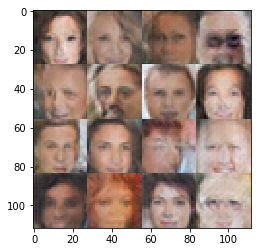

Epoch 1/5... Discriminator Loss: 1.0560... Generator Loss: 1.1959
Epoch 1/5... Discriminator Loss: 1.0066... Generator Loss: 1.0452
Epoch 1/5... Discriminator Loss: 1.3972... Generator Loss: 0.5655
Epoch 1/5... Discriminator Loss: 1.1062... Generator Loss: 1.2816
Epoch 1/5... Discriminator Loss: 1.0930... Generator Loss: 0.8507
Epoch 1/5... Discriminator Loss: 1.2883... Generator Loss: 0.7011
Epoch 1/5... Discriminator Loss: 1.0588... Generator Loss: 1.2430


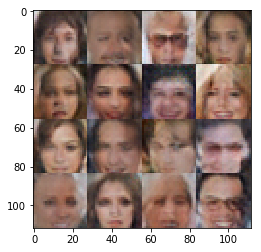

Epoch 1/5... Discriminator Loss: 1.3362... Generator Loss: 0.5488
Epoch 1/5... Discriminator Loss: 1.0084... Generator Loss: 1.0337
Epoch 1/5... Discriminator Loss: 1.0552... Generator Loss: 0.8744
Epoch 1/5... Discriminator Loss: 1.6833... Generator Loss: 0.3445
Epoch 1/5... Discriminator Loss: 1.1393... Generator Loss: 0.8583
Epoch 1/5... Discriminator Loss: 1.1954... Generator Loss: 0.8093


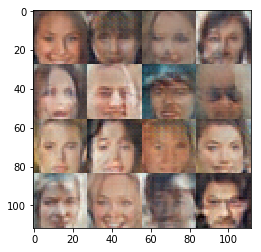

Epoch 1/5... Discriminator Loss: 1.3336... Generator Loss: 0.5988
Epoch 1/5... Discriminator Loss: 1.1706... Generator Loss: 1.2103
Epoch 1/5... Discriminator Loss: 1.3315... Generator Loss: 0.9732
Epoch 1/5... Discriminator Loss: 1.1099... Generator Loss: 1.2753
Epoch 1/5... Discriminator Loss: 0.9908... Generator Loss: 1.1314
Epoch 1/5... Discriminator Loss: 1.3138... Generator Loss: 0.6005
Epoch 1/5... Discriminator Loss: 1.1863... Generator Loss: 1.2472


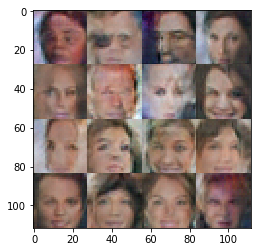

Epoch 1/5... Discriminator Loss: 1.3355... Generator Loss: 0.6034
Epoch 1/5... Discriminator Loss: 1.2955... Generator Loss: 0.8098
Epoch 1/5... Discriminator Loss: 1.1696... Generator Loss: 0.8296
Epoch 1/5... Discriminator Loss: 1.0221... Generator Loss: 0.9015
Epoch 1/5... Discriminator Loss: 1.3823... Generator Loss: 0.5919
Epoch 1/5... Discriminator Loss: 1.3206... Generator Loss: 0.5800
Epoch 1/5... Discriminator Loss: 1.1373... Generator Loss: 1.0316


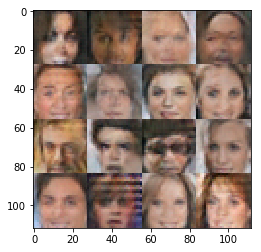

Epoch 1/5... Discriminator Loss: 1.0541... Generator Loss: 0.9641
Epoch 1/5... Discriminator Loss: 1.1882... Generator Loss: 0.7662
Epoch 1/5... Discriminator Loss: 1.1026... Generator Loss: 0.7874
Epoch 1/5... Discriminator Loss: 1.4874... Generator Loss: 0.4425
Epoch 1/5... Discriminator Loss: 1.2391... Generator Loss: 0.8413
Epoch 1/5... Discriminator Loss: 1.1256... Generator Loss: 1.0602


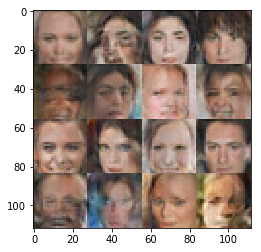

Epoch 1/5... Discriminator Loss: 0.9740... Generator Loss: 1.0559
Epoch 1/5... Discriminator Loss: 1.2198... Generator Loss: 0.7581
Epoch 1/5... Discriminator Loss: 1.2631... Generator Loss: 0.6180
Epoch 1/5... Discriminator Loss: 1.1379... Generator Loss: 1.2149
Epoch 1/5... Discriminator Loss: 1.2596... Generator Loss: 0.6048
Epoch 1/5... Discriminator Loss: 1.0551... Generator Loss: 1.0380
Epoch 1/5... Discriminator Loss: 1.3271... Generator Loss: 0.5379


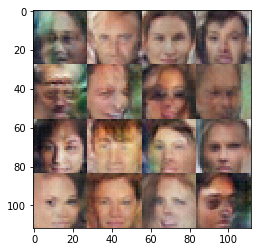

Epoch 1/5... Discriminator Loss: 1.2643... Generator Loss: 0.6416
Epoch 1/5... Discriminator Loss: 1.3081... Generator Loss: 0.5817
Epoch 1/5... Discriminator Loss: 1.1992... Generator Loss: 0.8060
Epoch 1/5... Discriminator Loss: 1.1746... Generator Loss: 0.7520
Epoch 1/5... Discriminator Loss: 1.0582... Generator Loss: 0.9354
Epoch 1/5... Discriminator Loss: 0.9849... Generator Loss: 1.3120
Epoch 1/5... Discriminator Loss: 1.1225... Generator Loss: 0.8460


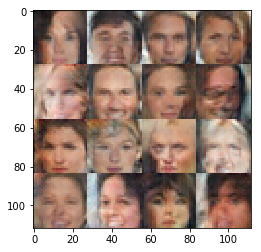

Epoch 1/5... Discriminator Loss: 1.1587... Generator Loss: 0.7887
Epoch 1/5... Discriminator Loss: 1.1989... Generator Loss: 0.8278
Epoch 1/5... Discriminator Loss: 1.3059... Generator Loss: 0.6995
Epoch 1/5... Discriminator Loss: 0.9405... Generator Loss: 1.2083
Epoch 1/5... Discriminator Loss: 1.3570... Generator Loss: 0.6125
Epoch 1/5... Discriminator Loss: 1.6174... Generator Loss: 0.4945


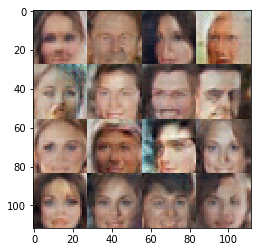

Epoch 1/5... Discriminator Loss: 1.0116... Generator Loss: 1.1288
Epoch 1/5... Discriminator Loss: 1.0359... Generator Loss: 0.8796
Epoch 1/5... Discriminator Loss: 1.1657... Generator Loss: 0.9912
Epoch 1/5... Discriminator Loss: 1.2149... Generator Loss: 0.9561
Epoch 1/5... Discriminator Loss: 1.3188... Generator Loss: 0.5970
Epoch 1/5... Discriminator Loss: 1.1872... Generator Loss: 0.7517
Epoch 1/5... Discriminator Loss: 0.9732... Generator Loss: 1.3121


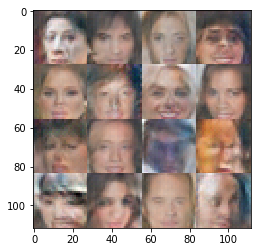

Epoch 1/5... Discriminator Loss: 1.1501... Generator Loss: 0.8789
Epoch 1/5... Discriminator Loss: 1.1181... Generator Loss: 1.0865
Epoch 1/5... Discriminator Loss: 1.1734... Generator Loss: 0.8756
Epoch 1/5... Discriminator Loss: 1.2047... Generator Loss: 1.0120
Epoch 1/5... Discriminator Loss: 1.0022... Generator Loss: 0.9935
Epoch 1/5... Discriminator Loss: 1.2080... Generator Loss: 0.8731
Epoch 1/5... Discriminator Loss: 1.2479... Generator Loss: 0.7362


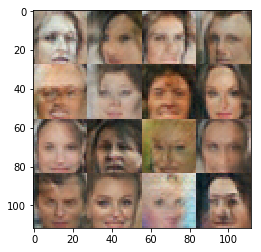

Epoch 1/5... Discriminator Loss: 1.4127... Generator Loss: 0.4837
Epoch 1/5... Discriminator Loss: 1.1431... Generator Loss: 0.8063
Epoch 1/5... Discriminator Loss: 1.3933... Generator Loss: 0.4926
Epoch 1/5... Discriminator Loss: 1.1623... Generator Loss: 0.9705
Epoch 1/5... Discriminator Loss: 1.0605... Generator Loss: 1.0432
Epoch 1/5... Discriminator Loss: 1.2545... Generator Loss: 0.6763


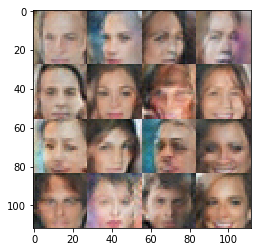

Epoch 1/5... Discriminator Loss: 1.0721... Generator Loss: 1.1082
Epoch 1/5... Discriminator Loss: 1.2647... Generator Loss: 0.7202
Epoch 1/5... Discriminator Loss: 1.1217... Generator Loss: 0.7817
Epoch 1/5... Discriminator Loss: 1.2161... Generator Loss: 0.6649
Epoch 1/5... Discriminator Loss: 1.1733... Generator Loss: 0.7389
Epoch 1/5... Discriminator Loss: 1.1987... Generator Loss: 0.6864
Epoch 1/5... Discriminator Loss: 1.0154... Generator Loss: 1.1041


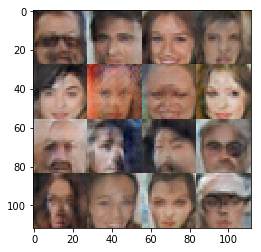

Epoch 1/5... Discriminator Loss: 1.2065... Generator Loss: 0.8423
Epoch 1/5... Discriminator Loss: 1.1795... Generator Loss: 0.8602
Epoch 1/5... Discriminator Loss: 1.3233... Generator Loss: 0.5854
Epoch 1/5... Discriminator Loss: 1.1572... Generator Loss: 0.8662
Epoch 1/5... Discriminator Loss: 1.2413... Generator Loss: 0.6900
Epoch 1/5... Discriminator Loss: 1.5499... Generator Loss: 0.4131
Epoch 1/5... Discriminator Loss: 1.1259... Generator Loss: 0.9002


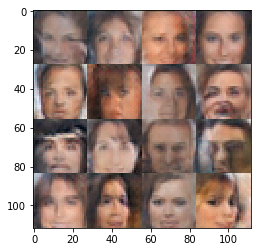

Epoch 1/5... Discriminator Loss: 1.3049... Generator Loss: 0.5694
Epoch 1/5... Discriminator Loss: 1.0969... Generator Loss: 0.7786
Epoch 1/5... Discriminator Loss: 1.4171... Generator Loss: 0.4745
Epoch 1/5... Discriminator Loss: 1.0644... Generator Loss: 1.3670
Epoch 1/5... Discriminator Loss: 1.1062... Generator Loss: 0.9698
Epoch 1/5... Discriminator Loss: 1.4341... Generator Loss: 0.4704


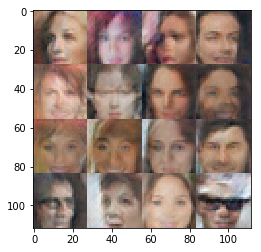

Epoch 1/5... Discriminator Loss: 1.1788... Generator Loss: 0.8084
Epoch 1/5... Discriminator Loss: 0.9533... Generator Loss: 0.9900
Epoch 1/5... Discriminator Loss: 1.5117... Generator Loss: 0.4394
Epoch 1/5... Discriminator Loss: 1.1416... Generator Loss: 0.9477
Epoch 1/5... Discriminator Loss: 1.3702... Generator Loss: 0.6678
Epoch 1/5... Discriminator Loss: 1.1469... Generator Loss: 0.8036
Epoch 1/5... Discriminator Loss: 1.4050... Generator Loss: 0.7683


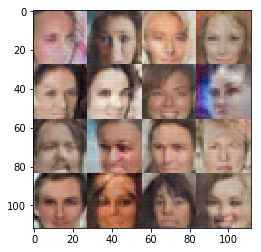

Epoch 1/5... Discriminator Loss: 1.1304... Generator Loss: 0.9895
Epoch 1/5... Discriminator Loss: 1.0928... Generator Loss: 0.8225
Epoch 1/5... Discriminator Loss: 1.1388... Generator Loss: 0.9640
Epoch 1/5... Discriminator Loss: 1.4623... Generator Loss: 0.4451
Epoch 1/5... Discriminator Loss: 1.2026... Generator Loss: 0.6680
Epoch 1/5... Discriminator Loss: 1.0804... Generator Loss: 0.7643
Epoch 1/5... Discriminator Loss: 1.1396... Generator Loss: 0.9883


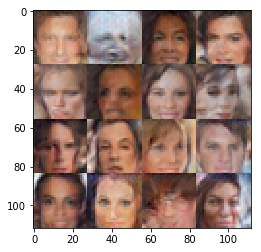

Epoch 1/5... Discriminator Loss: 1.1423... Generator Loss: 0.8492
Epoch 1/5... Discriminator Loss: 1.1910... Generator Loss: 0.8557
Epoch 1/5... Discriminator Loss: 1.2674... Generator Loss: 0.5833
Epoch 1/5... Discriminator Loss: 0.9800... Generator Loss: 1.1442
Epoch 1/5... Discriminator Loss: 1.2098... Generator Loss: 1.2332
Epoch 1/5... Discriminator Loss: 1.2848... Generator Loss: 0.7542


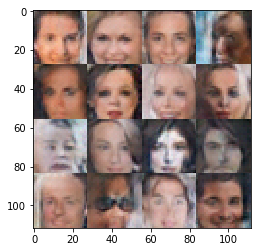

Epoch 1/5... Discriminator Loss: 1.1804... Generator Loss: 1.2184
Epoch 1/5... Discriminator Loss: 1.1502... Generator Loss: 0.8197
Epoch 1/5... Discriminator Loss: 1.2379... Generator Loss: 1.3213
Epoch 1/5... Discriminator Loss: 1.0515... Generator Loss: 1.3432
Epoch 1/5... Discriminator Loss: 1.3884... Generator Loss: 0.5497
Epoch 1/5... Discriminator Loss: 1.3056... Generator Loss: 0.6160
Epoch 1/5... Discriminator Loss: 1.3177... Generator Loss: 0.7134


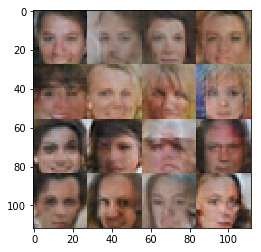

Epoch 1/5... Discriminator Loss: 1.2172... Generator Loss: 1.1144
Epoch 1/5... Discriminator Loss: 1.0902... Generator Loss: 0.8708
Epoch 1/5... Discriminator Loss: 1.5193... Generator Loss: 0.4752
Epoch 1/5... Discriminator Loss: 0.9894... Generator Loss: 1.0133
Epoch 1/5... Discriminator Loss: 1.2250... Generator Loss: 0.6896
Epoch 1/5... Discriminator Loss: 1.2483... Generator Loss: 0.7745
Epoch 1/5... Discriminator Loss: 1.2747... Generator Loss: 0.7181


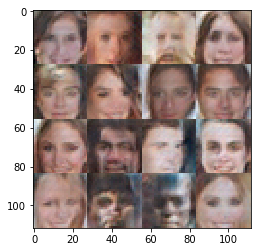

Epoch 1/5... Discriminator Loss: 1.0135... Generator Loss: 1.2131
Epoch 1/5... Discriminator Loss: 1.1311... Generator Loss: 1.5128
Epoch 1/5... Discriminator Loss: 1.3755... Generator Loss: 0.5632
Epoch 1/5... Discriminator Loss: 1.1718... Generator Loss: 0.9877
Epoch 1/5... Discriminator Loss: 1.1274... Generator Loss: 0.8101
Epoch 1/5... Discriminator Loss: 1.2488... Generator Loss: 0.8240


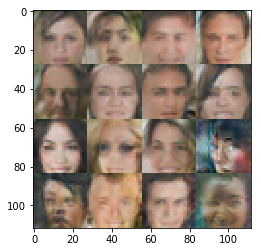

Epoch 1/5... Discriminator Loss: 1.2277... Generator Loss: 0.7073
Epoch 1/5... Discriminator Loss: 1.0760... Generator Loss: 0.8877
Epoch 1/5... Discriminator Loss: 1.3291... Generator Loss: 0.5689
Epoch 1/5... Discriminator Loss: 1.0975... Generator Loss: 0.8471
Epoch 1/5... Discriminator Loss: 1.0557... Generator Loss: 1.2442
Epoch 1/5... Discriminator Loss: 1.1375... Generator Loss: 0.8075
Epoch 1/5... Discriminator Loss: 1.2508... Generator Loss: 0.9707


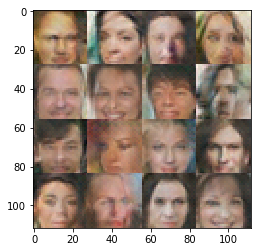

Epoch 1/5... Discriminator Loss: 1.1610... Generator Loss: 0.7709
Epoch 1/5... Discriminator Loss: 0.9370... Generator Loss: 1.3977
Epoch 1/5... Discriminator Loss: 1.2367... Generator Loss: 1.1349
Epoch 1/5... Discriminator Loss: 1.0022... Generator Loss: 1.0280
Epoch 1/5... Discriminator Loss: 1.1936... Generator Loss: 0.7841
Epoch 1/5... Discriminator Loss: 1.0967... Generator Loss: 0.8062
Epoch 1/5... Discriminator Loss: 1.1586... Generator Loss: 1.0113


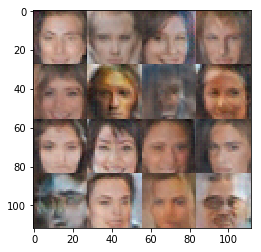

Epoch 1/5... Discriminator Loss: 1.4475... Generator Loss: 0.4581
Epoch 1/5... Discriminator Loss: 1.3216... Generator Loss: 0.7016
Epoch 1/5... Discriminator Loss: 1.1770... Generator Loss: 0.8453
Epoch 1/5... Discriminator Loss: 1.1427... Generator Loss: 0.7070
Epoch 1/5... Discriminator Loss: 1.2611... Generator Loss: 0.6959
Epoch 1/5... Discriminator Loss: 1.1029... Generator Loss: 0.8060


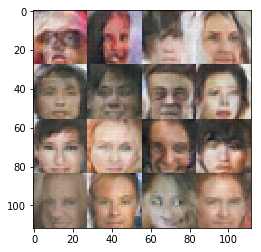

Epoch 1/5... Discriminator Loss: 1.1344... Generator Loss: 1.0332
Epoch 1/5... Discriminator Loss: 1.1670... Generator Loss: 0.8492
Epoch 1/5... Discriminator Loss: 1.3391... Generator Loss: 0.6093
Epoch 1/5... Discriminator Loss: 1.2045... Generator Loss: 0.6522
Epoch 1/5... Discriminator Loss: 1.2659... Generator Loss: 1.0393
Epoch 1/5... Discriminator Loss: 1.0674... Generator Loss: 0.8977
Epoch 1/5... Discriminator Loss: 1.2282... Generator Loss: 0.7366


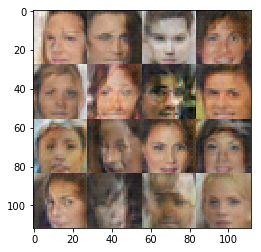

Epoch 1/5... Discriminator Loss: 1.3455... Generator Loss: 1.1909
Epoch 1/5... Discriminator Loss: 1.1887... Generator Loss: 0.7912
Epoch 1/5... Discriminator Loss: 1.5340... Generator Loss: 0.4017
Epoch 1/5... Discriminator Loss: 1.0358... Generator Loss: 0.9045
Epoch 1/5... Discriminator Loss: 1.0108... Generator Loss: 1.2204
Epoch 1/5... Discriminator Loss: 1.3249... Generator Loss: 0.5860
Epoch 1/5... Discriminator Loss: 0.9991... Generator Loss: 1.0856


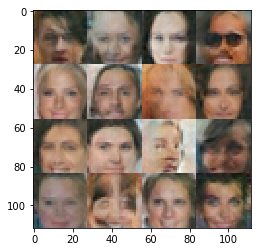

Epoch 1/5... Discriminator Loss: 1.2714... Generator Loss: 0.7063
Epoch 1/5... Discriminator Loss: 1.0208... Generator Loss: 1.3457
Epoch 2/5... Discriminator Loss: 1.5503... Generator Loss: 0.3944


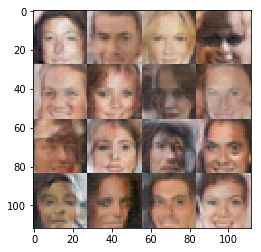

Epoch 2/5... Discriminator Loss: 1.3058... Generator Loss: 0.6873
Epoch 2/5... Discriminator Loss: 1.1817... Generator Loss: 0.7265
Epoch 2/5... Discriminator Loss: 0.9615... Generator Loss: 1.0572
Epoch 2/5... Discriminator Loss: 1.1807... Generator Loss: 0.6958
Epoch 2/5... Discriminator Loss: 1.2924... Generator Loss: 0.6030
Epoch 2/5... Discriminator Loss: 1.5806... Generator Loss: 0.4765


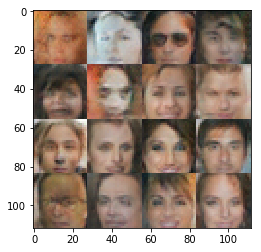

Epoch 2/5... Discriminator Loss: 1.0295... Generator Loss: 1.1263
Epoch 2/5... Discriminator Loss: 1.0530... Generator Loss: 0.9615
Epoch 2/5... Discriminator Loss: 1.1760... Generator Loss: 0.7559
Epoch 2/5... Discriminator Loss: 1.1748... Generator Loss: 0.8406
Epoch 2/5... Discriminator Loss: 1.1431... Generator Loss: 0.7865
Epoch 2/5... Discriminator Loss: 0.9735... Generator Loss: 1.1272
Epoch 2/5... Discriminator Loss: 1.1824... Generator Loss: 0.7512


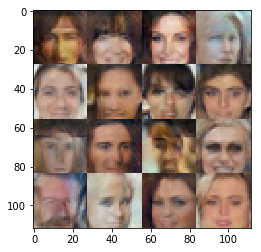

Epoch 2/5... Discriminator Loss: 1.2619... Generator Loss: 0.6751
Epoch 2/5... Discriminator Loss: 1.2225... Generator Loss: 0.7638
Epoch 2/5... Discriminator Loss: 1.2648... Generator Loss: 0.6684
Epoch 2/5... Discriminator Loss: 1.0685... Generator Loss: 0.9643
Epoch 2/5... Discriminator Loss: 1.2396... Generator Loss: 0.7051
Epoch 2/5... Discriminator Loss: 1.5503... Generator Loss: 0.4235
Epoch 2/5... Discriminator Loss: 1.4034... Generator Loss: 0.5036


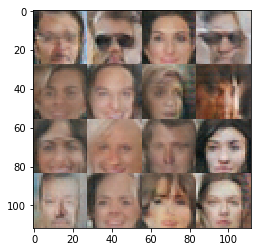

Epoch 2/5... Discriminator Loss: 1.3142... Generator Loss: 0.6134
Epoch 2/5... Discriminator Loss: 1.2810... Generator Loss: 1.0912
Epoch 2/5... Discriminator Loss: 1.3680... Generator Loss: 0.6104
Epoch 2/5... Discriminator Loss: 1.0297... Generator Loss: 1.1743
Epoch 2/5... Discriminator Loss: 1.0057... Generator Loss: 0.8751
Epoch 2/5... Discriminator Loss: 1.3680... Generator Loss: 0.5990


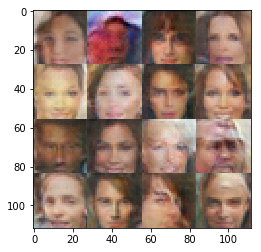

Epoch 2/5... Discriminator Loss: 1.2649... Generator Loss: 0.6118
Epoch 2/5... Discriminator Loss: 1.1669... Generator Loss: 1.0610
Epoch 2/5... Discriminator Loss: 0.9988... Generator Loss: 0.9346
Epoch 2/5... Discriminator Loss: 1.0453... Generator Loss: 0.8853
Epoch 2/5... Discriminator Loss: 1.2133... Generator Loss: 0.6616
Epoch 2/5... Discriminator Loss: 1.0588... Generator Loss: 1.0658
Epoch 2/5... Discriminator Loss: 1.0755... Generator Loss: 1.0784


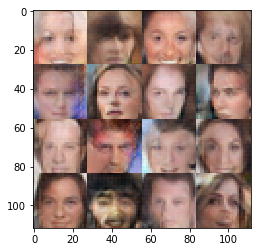

Epoch 2/5... Discriminator Loss: 1.1829... Generator Loss: 0.6849
Epoch 2/5... Discriminator Loss: 1.2794... Generator Loss: 0.6557
Epoch 2/5... Discriminator Loss: 1.0577... Generator Loss: 0.8793
Epoch 2/5... Discriminator Loss: 1.1621... Generator Loss: 1.0688
Epoch 2/5... Discriminator Loss: 1.4669... Generator Loss: 0.4840
Epoch 2/5... Discriminator Loss: 1.1057... Generator Loss: 1.1062
Epoch 2/5... Discriminator Loss: 1.1269... Generator Loss: 0.9277


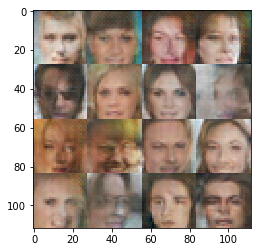

Epoch 2/5... Discriminator Loss: 1.2335... Generator Loss: 0.7724
Epoch 2/5... Discriminator Loss: 1.4451... Generator Loss: 0.5251
Epoch 2/5... Discriminator Loss: 1.1917... Generator Loss: 0.6984
Epoch 2/5... Discriminator Loss: 1.1504... Generator Loss: 1.2094
Epoch 2/5... Discriminator Loss: 1.0587... Generator Loss: 0.8675
Epoch 2/5... Discriminator Loss: 1.2515... Generator Loss: 0.6524


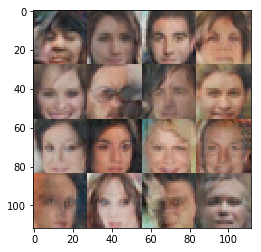

Epoch 2/5... Discriminator Loss: 1.2364... Generator Loss: 0.9543
Epoch 2/5... Discriminator Loss: 1.1758... Generator Loss: 0.7410
Epoch 2/5... Discriminator Loss: 1.3135... Generator Loss: 0.5971
Epoch 2/5... Discriminator Loss: 1.1820... Generator Loss: 0.7132
Epoch 2/5... Discriminator Loss: 1.4969... Generator Loss: 0.4568
Epoch 2/5... Discriminator Loss: 1.0818... Generator Loss: 0.8328
Epoch 2/5... Discriminator Loss: 1.3831... Generator Loss: 0.5803


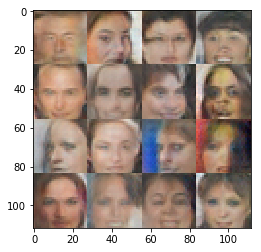

Epoch 2/5... Discriminator Loss: 1.3683... Generator Loss: 0.5750
Epoch 2/5... Discriminator Loss: 1.4217... Generator Loss: 0.5051
Epoch 2/5... Discriminator Loss: 1.3915... Generator Loss: 0.5239
Epoch 2/5... Discriminator Loss: 1.3653... Generator Loss: 0.5859
Epoch 2/5... Discriminator Loss: 2.1646... Generator Loss: 2.7795
Epoch 2/5... Discriminator Loss: 1.0098... Generator Loss: 1.0764
Epoch 2/5... Discriminator Loss: 1.2752... Generator Loss: 0.9258


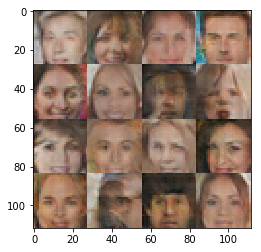

Epoch 2/5... Discriminator Loss: 1.2272... Generator Loss: 0.7551
Epoch 2/5... Discriminator Loss: 1.0809... Generator Loss: 0.9679
Epoch 2/5... Discriminator Loss: 1.3683... Generator Loss: 0.6160
Epoch 2/5... Discriminator Loss: 1.2339... Generator Loss: 0.6757
Epoch 2/5... Discriminator Loss: 1.1860... Generator Loss: 0.8436
Epoch 2/5... Discriminator Loss: 1.0868... Generator Loss: 1.2395


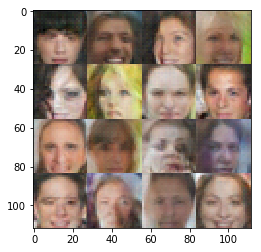

Epoch 2/5... Discriminator Loss: 1.2634... Generator Loss: 0.6505
Epoch 2/5... Discriminator Loss: 1.1188... Generator Loss: 0.9883
Epoch 2/5... Discriminator Loss: 1.1398... Generator Loss: 0.8246
Epoch 2/5... Discriminator Loss: 1.1269... Generator Loss: 0.7681
Epoch 2/5... Discriminator Loss: 1.2850... Generator Loss: 0.6021
Epoch 2/5... Discriminator Loss: 1.1531... Generator Loss: 0.8090
Epoch 2/5... Discriminator Loss: 1.1942... Generator Loss: 0.7614


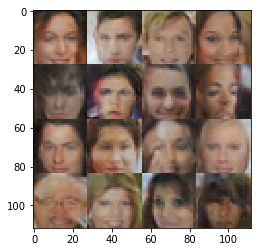

Epoch 2/5... Discriminator Loss: 1.0847... Generator Loss: 1.1741
Epoch 2/5... Discriminator Loss: 0.9555... Generator Loss: 1.1307
Epoch 2/5... Discriminator Loss: 1.1790... Generator Loss: 0.8718
Epoch 2/5... Discriminator Loss: 1.1783... Generator Loss: 0.7782
Epoch 2/5... Discriminator Loss: 1.3329... Generator Loss: 0.5687
Epoch 2/5... Discriminator Loss: 1.0347... Generator Loss: 1.1735
Epoch 2/5... Discriminator Loss: 1.1045... Generator Loss: 0.9999


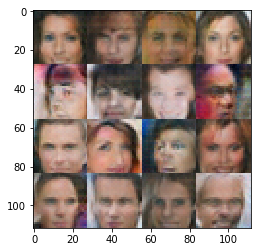

Epoch 2/5... Discriminator Loss: 1.0215... Generator Loss: 0.8500
Epoch 2/5... Discriminator Loss: 1.2088... Generator Loss: 0.7592
Epoch 2/5... Discriminator Loss: 1.2769... Generator Loss: 0.7585
Epoch 2/5... Discriminator Loss: 1.2131... Generator Loss: 0.6765
Epoch 2/5... Discriminator Loss: 1.2117... Generator Loss: 0.9423
Epoch 2/5... Discriminator Loss: 1.1493... Generator Loss: 0.8094


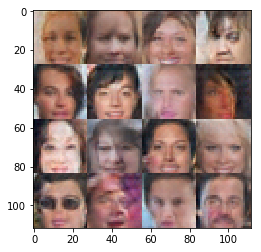

Epoch 2/5... Discriminator Loss: 0.9986... Generator Loss: 1.0292
Epoch 2/5... Discriminator Loss: 1.0679... Generator Loss: 0.9584
Epoch 2/5... Discriminator Loss: 0.9943... Generator Loss: 1.5109
Epoch 2/5... Discriminator Loss: 1.1268... Generator Loss: 1.0381
Epoch 2/5... Discriminator Loss: 1.1028... Generator Loss: 0.8917
Epoch 2/5... Discriminator Loss: 1.3920... Generator Loss: 0.5423
Epoch 2/5... Discriminator Loss: 1.4866... Generator Loss: 0.4637


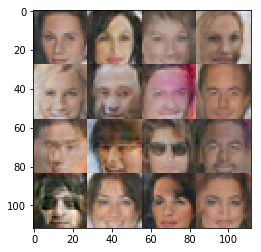

Epoch 2/5... Discriminator Loss: 1.2323... Generator Loss: 0.6133
Epoch 2/5... Discriminator Loss: 1.0474... Generator Loss: 0.9635
Epoch 2/5... Discriminator Loss: 1.3142... Generator Loss: 0.5244
Epoch 2/5... Discriminator Loss: 1.3059... Generator Loss: 0.5877
Epoch 2/5... Discriminator Loss: 1.0792... Generator Loss: 1.0161
Epoch 2/5... Discriminator Loss: 1.3299... Generator Loss: 0.5842
Epoch 2/5... Discriminator Loss: 1.1610... Generator Loss: 0.7323


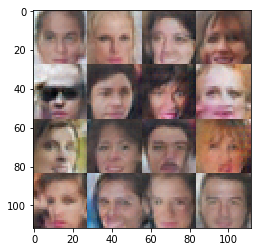

Epoch 2/5... Discriminator Loss: 1.0025... Generator Loss: 1.1566
Epoch 2/5... Discriminator Loss: 1.0430... Generator Loss: 0.9476
Epoch 2/5... Discriminator Loss: 1.1931... Generator Loss: 0.8882
Epoch 2/5... Discriminator Loss: 1.1044... Generator Loss: 0.8052
Epoch 2/5... Discriminator Loss: 1.0312... Generator Loss: 1.0006
Epoch 2/5... Discriminator Loss: 1.2184... Generator Loss: 0.7143


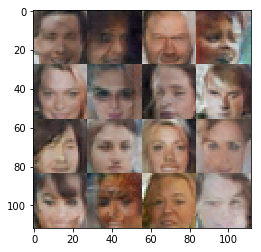

Epoch 2/5... Discriminator Loss: 1.2526... Generator Loss: 0.6633
Epoch 2/5... Discriminator Loss: 1.0570... Generator Loss: 0.9951
Epoch 2/5... Discriminator Loss: 1.2020... Generator Loss: 0.6676
Epoch 2/5... Discriminator Loss: 1.2875... Generator Loss: 0.5717
Epoch 2/5... Discriminator Loss: 0.8965... Generator Loss: 1.2044
Epoch 2/5... Discriminator Loss: 1.1611... Generator Loss: 0.8743
Epoch 2/5... Discriminator Loss: 1.2251... Generator Loss: 0.6555


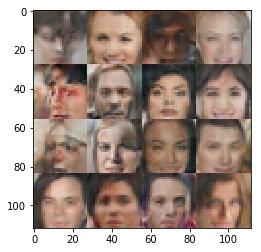

Epoch 2/5... Discriminator Loss: 1.4894... Generator Loss: 0.4754
Epoch 2/5... Discriminator Loss: 0.9791... Generator Loss: 1.0713
Epoch 2/5... Discriminator Loss: 1.0154... Generator Loss: 1.0484
Epoch 2/5... Discriminator Loss: 1.3159... Generator Loss: 0.6354
Epoch 2/5... Discriminator Loss: 1.1866... Generator Loss: 0.8126
Epoch 2/5... Discriminator Loss: 1.2988... Generator Loss: 0.6340
Epoch 2/5... Discriminator Loss: 1.2850... Generator Loss: 0.5739


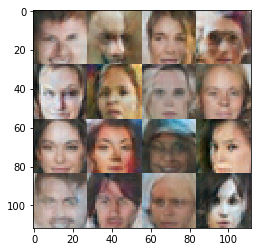

Epoch 2/5... Discriminator Loss: 1.3006... Generator Loss: 0.7334
Epoch 2/5... Discriminator Loss: 1.5416... Generator Loss: 0.4572
Epoch 2/5... Discriminator Loss: 1.1282... Generator Loss: 0.9371
Epoch 2/5... Discriminator Loss: 1.4872... Generator Loss: 0.4725
Epoch 2/5... Discriminator Loss: 1.0751... Generator Loss: 0.9608
Epoch 2/5... Discriminator Loss: 1.1606... Generator Loss: 0.8887


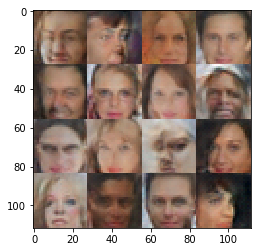

Epoch 2/5... Discriminator Loss: 1.1294... Generator Loss: 0.8622
Epoch 2/5... Discriminator Loss: 1.1964... Generator Loss: 0.6482
Epoch 2/5... Discriminator Loss: 1.1004... Generator Loss: 0.7687
Epoch 2/5... Discriminator Loss: 1.1898... Generator Loss: 0.9531
Epoch 2/5... Discriminator Loss: 1.4280... Generator Loss: 0.4471
Epoch 2/5... Discriminator Loss: 1.4778... Generator Loss: 0.4532
Epoch 2/5... Discriminator Loss: 1.2308... Generator Loss: 0.6755


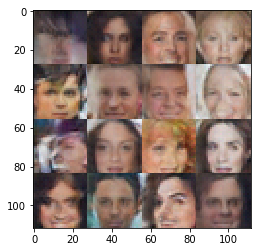

Epoch 2/5... Discriminator Loss: 1.1614... Generator Loss: 0.8827
Epoch 2/5... Discriminator Loss: 1.5070... Generator Loss: 0.4417
Epoch 2/5... Discriminator Loss: 1.7566... Generator Loss: 0.4184
Epoch 2/5... Discriminator Loss: 1.2491... Generator Loss: 0.6406
Epoch 2/5... Discriminator Loss: 1.1516... Generator Loss: 0.7455
Epoch 2/5... Discriminator Loss: 1.1827... Generator Loss: 0.7695
Epoch 2/5... Discriminator Loss: 1.0501... Generator Loss: 0.9736


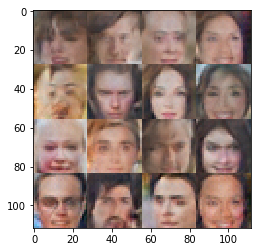

Epoch 2/5... Discriminator Loss: 1.1940... Generator Loss: 1.5761
Epoch 2/5... Discriminator Loss: 1.2622... Generator Loss: 0.6507
Epoch 2/5... Discriminator Loss: 1.3021... Generator Loss: 0.5725
Epoch 2/5... Discriminator Loss: 1.1965... Generator Loss: 0.6465
Epoch 2/5... Discriminator Loss: 1.2331... Generator Loss: 0.7714
Epoch 2/5... Discriminator Loss: 1.1479... Generator Loss: 0.9750


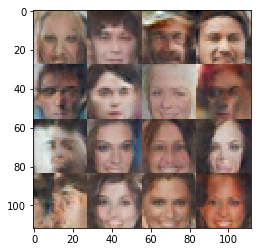

Epoch 2/5... Discriminator Loss: 0.9113... Generator Loss: 1.4177
Epoch 2/5... Discriminator Loss: 1.0486... Generator Loss: 0.9796
Epoch 2/5... Discriminator Loss: 1.0495... Generator Loss: 0.8570
Epoch 2/5... Discriminator Loss: 1.3405... Generator Loss: 0.6573
Epoch 2/5... Discriminator Loss: 1.2597... Generator Loss: 1.1185
Epoch 2/5... Discriminator Loss: 1.1071... Generator Loss: 0.9570
Epoch 2/5... Discriminator Loss: 1.2758... Generator Loss: 0.6463


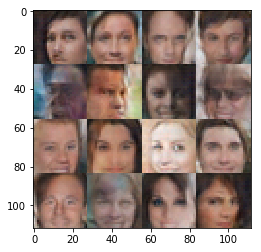

Epoch 2/5... Discriminator Loss: 1.1463... Generator Loss: 0.7976
Epoch 2/5... Discriminator Loss: 1.0135... Generator Loss: 0.9323
Epoch 2/5... Discriminator Loss: 1.0410... Generator Loss: 1.0038
Epoch 2/5... Discriminator Loss: 1.1714... Generator Loss: 0.6980
Epoch 2/5... Discriminator Loss: 1.1128... Generator Loss: 0.7844
Epoch 2/5... Discriminator Loss: 1.2562... Generator Loss: 0.9095
Epoch 2/5... Discriminator Loss: 1.2084... Generator Loss: 0.7052


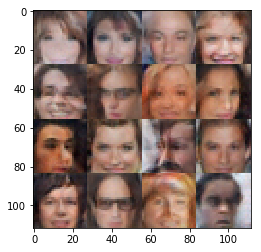

Epoch 2/5... Discriminator Loss: 1.2157... Generator Loss: 0.9396
Epoch 2/5... Discriminator Loss: 1.0227... Generator Loss: 1.1791
Epoch 2/5... Discriminator Loss: 1.2528... Generator Loss: 0.6299
Epoch 2/5... Discriminator Loss: 1.3109... Generator Loss: 1.3020
Epoch 2/5... Discriminator Loss: 1.1778... Generator Loss: 0.7156
Epoch 2/5... Discriminator Loss: 1.1034... Generator Loss: 0.8068


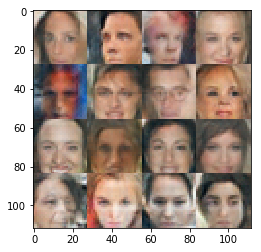

Epoch 2/5... Discriminator Loss: 1.0381... Generator Loss: 1.1743
Epoch 2/5... Discriminator Loss: 1.1650... Generator Loss: 0.7187
Epoch 2/5... Discriminator Loss: 1.1693... Generator Loss: 0.6926
Epoch 2/5... Discriminator Loss: 1.3426... Generator Loss: 0.5790
Epoch 2/5... Discriminator Loss: 1.1088... Generator Loss: 0.8692
Epoch 2/5... Discriminator Loss: 1.1701... Generator Loss: 0.7508
Epoch 2/5... Discriminator Loss: 1.1270... Generator Loss: 0.9187


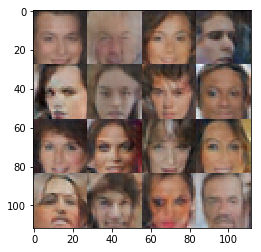

Epoch 2/5... Discriminator Loss: 1.0843... Generator Loss: 0.9132
Epoch 2/5... Discriminator Loss: 1.4709... Generator Loss: 0.4886
Epoch 2/5... Discriminator Loss: 1.5150... Generator Loss: 0.4793
Epoch 2/5... Discriminator Loss: 1.0600... Generator Loss: 0.8657
Epoch 2/5... Discriminator Loss: 1.0901... Generator Loss: 0.8283
Epoch 2/5... Discriminator Loss: 1.8180... Generator Loss: 0.3619
Epoch 2/5... Discriminator Loss: 1.3216... Generator Loss: 0.6718


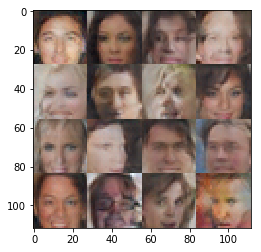

Epoch 2/5... Discriminator Loss: 0.9298... Generator Loss: 1.1617
Epoch 2/5... Discriminator Loss: 1.2318... Generator Loss: 0.6502
Epoch 2/5... Discriminator Loss: 1.3276... Generator Loss: 0.5677
Epoch 2/5... Discriminator Loss: 1.2939... Generator Loss: 0.6553
Epoch 2/5... Discriminator Loss: 1.1574... Generator Loss: 0.7713
Epoch 2/5... Discriminator Loss: 0.9934... Generator Loss: 0.9679


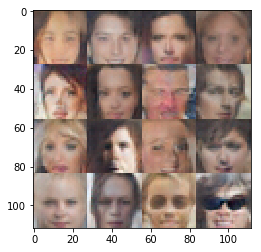

Epoch 2/5... Discriminator Loss: 1.1374... Generator Loss: 0.8726
Epoch 2/5... Discriminator Loss: 1.2651... Generator Loss: 0.6585
Epoch 2/5... Discriminator Loss: 1.3930... Generator Loss: 0.4854
Epoch 2/5... Discriminator Loss: 1.1580... Generator Loss: 0.7336
Epoch 2/5... Discriminator Loss: 1.2084... Generator Loss: 0.6787
Epoch 2/5... Discriminator Loss: 1.0877... Generator Loss: 0.8481
Epoch 2/5... Discriminator Loss: 1.2073... Generator Loss: 0.8949


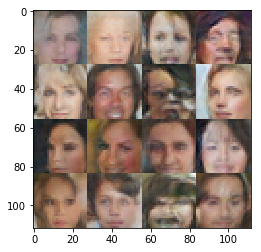

Epoch 2/5... Discriminator Loss: 1.0335... Generator Loss: 1.0526
Epoch 2/5... Discriminator Loss: 1.2903... Generator Loss: 0.6086
Epoch 2/5... Discriminator Loss: 1.4228... Generator Loss: 0.4985
Epoch 2/5... Discriminator Loss: 1.2231... Generator Loss: 0.8419
Epoch 2/5... Discriminator Loss: 1.1088... Generator Loss: 0.9725
Epoch 2/5... Discriminator Loss: 1.3883... Generator Loss: 0.6011
Epoch 2/5... Discriminator Loss: 1.3193... Generator Loss: 0.5301


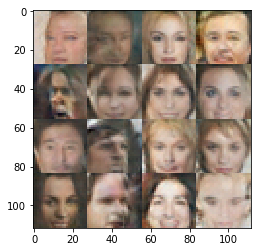

Epoch 2/5... Discriminator Loss: 1.2051... Generator Loss: 0.9413
Epoch 2/5... Discriminator Loss: 1.1051... Generator Loss: 0.8671
Epoch 2/5... Discriminator Loss: 1.2792... Generator Loss: 0.5658
Epoch 2/5... Discriminator Loss: 1.2915... Generator Loss: 0.5806
Epoch 2/5... Discriminator Loss: 1.1118... Generator Loss: 0.8225
Epoch 2/5... Discriminator Loss: 1.0968... Generator Loss: 1.0990


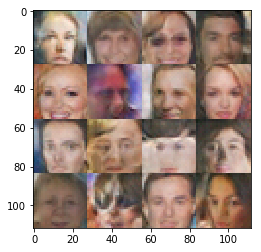

Epoch 2/5... Discriminator Loss: 1.5648... Generator Loss: 0.4017
Epoch 2/5... Discriminator Loss: 1.1475... Generator Loss: 1.0357
Epoch 2/5... Discriminator Loss: 1.0242... Generator Loss: 0.9072
Epoch 2/5... Discriminator Loss: 0.9371... Generator Loss: 1.3068
Epoch 2/5... Discriminator Loss: 1.6128... Generator Loss: 0.3869
Epoch 2/5... Discriminator Loss: 1.0786... Generator Loss: 0.9201
Epoch 2/5... Discriminator Loss: 1.2979... Generator Loss: 1.5855


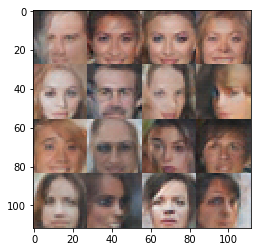

Epoch 2/5... Discriminator Loss: 1.2149... Generator Loss: 0.7053
Epoch 2/5... Discriminator Loss: 1.2070... Generator Loss: 0.7177
Epoch 2/5... Discriminator Loss: 1.2419... Generator Loss: 0.6873
Epoch 2/5... Discriminator Loss: 1.1312... Generator Loss: 1.2042
Epoch 2/5... Discriminator Loss: 1.3786... Generator Loss: 0.5226
Epoch 2/5... Discriminator Loss: 1.2536... Generator Loss: 0.6457
Epoch 2/5... Discriminator Loss: 1.0537... Generator Loss: 1.1193


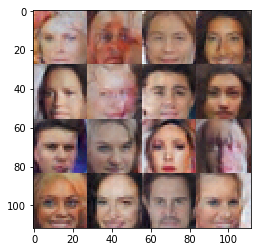

Epoch 2/5... Discriminator Loss: 1.0891... Generator Loss: 0.9028
Epoch 2/5... Discriminator Loss: 1.5199... Generator Loss: 0.4364
Epoch 2/5... Discriminator Loss: 1.2806... Generator Loss: 0.6163
Epoch 2/5... Discriminator Loss: 1.0629... Generator Loss: 0.9050
Epoch 2/5... Discriminator Loss: 0.9636... Generator Loss: 1.1686
Epoch 2/5... Discriminator Loss: 1.1530... Generator Loss: 0.7711


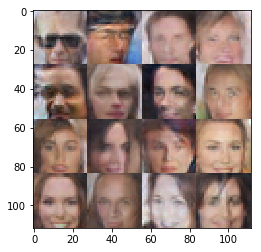

Epoch 2/5... Discriminator Loss: 1.2397... Generator Loss: 0.7341
Epoch 2/5... Discriminator Loss: 1.2722... Generator Loss: 0.6948
Epoch 2/5... Discriminator Loss: 1.2523... Generator Loss: 0.6525
Epoch 2/5... Discriminator Loss: 1.1745... Generator Loss: 0.7209
Epoch 2/5... Discriminator Loss: 1.0084... Generator Loss: 1.7081
Epoch 2/5... Discriminator Loss: 0.9152... Generator Loss: 1.1137
Epoch 2/5... Discriminator Loss: 1.1047... Generator Loss: 0.8318


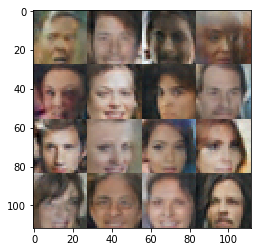

Epoch 2/5... Discriminator Loss: 1.3728... Generator Loss: 0.5240
Epoch 2/5... Discriminator Loss: 1.3009... Generator Loss: 0.6501
Epoch 2/5... Discriminator Loss: 1.0093... Generator Loss: 1.1779
Epoch 2/5... Discriminator Loss: 1.2887... Generator Loss: 0.6098
Epoch 2/5... Discriminator Loss: 1.0733... Generator Loss: 0.9328
Epoch 2/5... Discriminator Loss: 1.0681... Generator Loss: 0.8259
Epoch 2/5... Discriminator Loss: 1.0721... Generator Loss: 0.8442


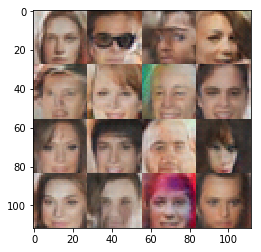

Epoch 2/5... Discriminator Loss: 1.0915... Generator Loss: 1.1745
Epoch 2/5... Discriminator Loss: 1.3387... Generator Loss: 0.5719
Epoch 2/5... Discriminator Loss: 1.0595... Generator Loss: 1.0948
Epoch 2/5... Discriminator Loss: 1.1679... Generator Loss: 0.7617
Epoch 2/5... Discriminator Loss: 1.2865... Generator Loss: 0.5899
Epoch 2/5... Discriminator Loss: 1.2190... Generator Loss: 0.7249


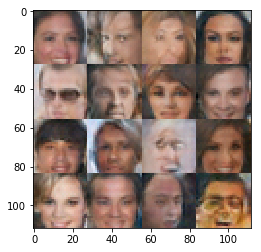

Epoch 2/5... Discriminator Loss: 1.2122... Generator Loss: 0.7129
Epoch 2/5... Discriminator Loss: 1.2423... Generator Loss: 0.6716
Epoch 2/5... Discriminator Loss: 1.0802... Generator Loss: 1.2420
Epoch 2/5... Discriminator Loss: 1.1679... Generator Loss: 0.7911
Epoch 2/5... Discriminator Loss: 1.0649... Generator Loss: 1.0786
Epoch 2/5... Discriminator Loss: 1.1759... Generator Loss: 0.7413
Epoch 2/5... Discriminator Loss: 0.9080... Generator Loss: 1.2280


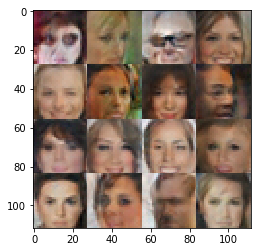

Epoch 2/5... Discriminator Loss: 1.6154... Generator Loss: 0.4405
Epoch 2/5... Discriminator Loss: 1.3400... Generator Loss: 1.0788
Epoch 2/5... Discriminator Loss: 1.1643... Generator Loss: 0.9668
Epoch 2/5... Discriminator Loss: 1.3215... Generator Loss: 0.6348
Epoch 2/5... Discriminator Loss: 0.9558... Generator Loss: 1.6645
Epoch 2/5... Discriminator Loss: 1.2900... Generator Loss: 0.6482
Epoch 2/5... Discriminator Loss: 1.2224... Generator Loss: 0.8193


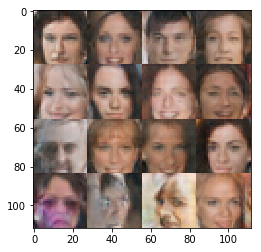

Epoch 2/5... Discriminator Loss: 1.1243... Generator Loss: 0.9511
Epoch 2/5... Discriminator Loss: 1.3000... Generator Loss: 0.6038
Epoch 2/5... Discriminator Loss: 0.8441... Generator Loss: 1.9395
Epoch 2/5... Discriminator Loss: 1.3703... Generator Loss: 0.5279
Epoch 2/5... Discriminator Loss: 0.9618... Generator Loss: 0.9736
Epoch 2/5... Discriminator Loss: 0.9035... Generator Loss: 1.4368


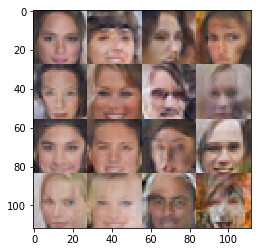

Epoch 2/5... Discriminator Loss: 1.2376... Generator Loss: 0.8249
Epoch 2/5... Discriminator Loss: 0.9907... Generator Loss: 1.1509
Epoch 2/5... Discriminator Loss: 1.4133... Generator Loss: 0.6671
Epoch 2/5... Discriminator Loss: 1.1074... Generator Loss: 1.2171
Epoch 2/5... Discriminator Loss: 1.1094... Generator Loss: 0.9149
Epoch 2/5... Discriminator Loss: 1.3490... Generator Loss: 0.5314
Epoch 2/5... Discriminator Loss: 1.0195... Generator Loss: 0.9748


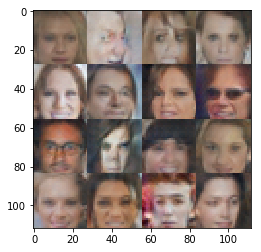

Epoch 2/5... Discriminator Loss: 1.4463... Generator Loss: 0.5203
Epoch 2/5... Discriminator Loss: 1.0324... Generator Loss: 1.0267
Epoch 2/5... Discriminator Loss: 1.3510... Generator Loss: 0.5004
Epoch 2/5... Discriminator Loss: 0.9716... Generator Loss: 0.9443
Epoch 2/5... Discriminator Loss: 1.1347... Generator Loss: 0.7747
Epoch 2/5... Discriminator Loss: 1.1911... Generator Loss: 0.6967
Epoch 2/5... Discriminator Loss: 1.1644... Generator Loss: 0.7326


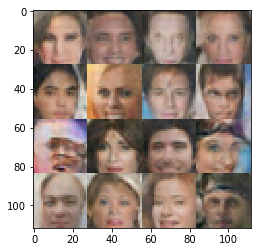

Epoch 2/5... Discriminator Loss: 1.1657... Generator Loss: 0.7268
Epoch 2/5... Discriminator Loss: 1.1878... Generator Loss: 0.7927
Epoch 2/5... Discriminator Loss: 1.2578... Generator Loss: 0.6134
Epoch 2/5... Discriminator Loss: 1.1852... Generator Loss: 0.7272
Epoch 2/5... Discriminator Loss: 0.8069... Generator Loss: 1.5174
Epoch 2/5... Discriminator Loss: 1.2956... Generator Loss: 0.6155


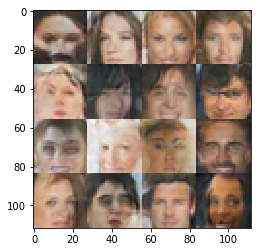

Epoch 2/5... Discriminator Loss: 0.8273... Generator Loss: 1.3264
Epoch 2/5... Discriminator Loss: 1.1504... Generator Loss: 0.7458
Epoch 2/5... Discriminator Loss: 1.1995... Generator Loss: 0.7141
Epoch 2/5... Discriminator Loss: 1.4607... Generator Loss: 0.4805
Epoch 2/5... Discriminator Loss: 1.2268... Generator Loss: 0.6886
Epoch 2/5... Discriminator Loss: 0.9912... Generator Loss: 1.3926
Epoch 2/5... Discriminator Loss: 1.3288... Generator Loss: 0.5965


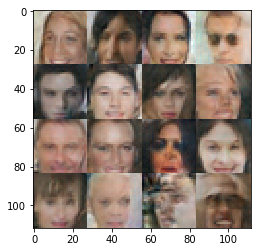

Epoch 2/5... Discriminator Loss: 1.1714... Generator Loss: 0.6809
Epoch 2/5... Discriminator Loss: 1.3767... Generator Loss: 0.5394
Epoch 2/5... Discriminator Loss: 1.1499... Generator Loss: 0.8487
Epoch 2/5... Discriminator Loss: 0.9525... Generator Loss: 1.1131
Epoch 2/5... Discriminator Loss: 1.0158... Generator Loss: 1.1172
Epoch 2/5... Discriminator Loss: 1.0929... Generator Loss: 0.9287
Epoch 2/5... Discriminator Loss: 1.2814... Generator Loss: 0.5947


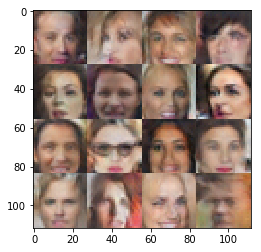

Epoch 2/5... Discriminator Loss: 1.0421... Generator Loss: 0.9840
Epoch 2/5... Discriminator Loss: 1.1133... Generator Loss: 0.9733
Epoch 2/5... Discriminator Loss: 1.1804... Generator Loss: 0.6464
Epoch 2/5... Discriminator Loss: 1.2957... Generator Loss: 0.6755
Epoch 2/5... Discriminator Loss: 0.9316... Generator Loss: 1.2230
Epoch 2/5... Discriminator Loss: 1.3458... Generator Loss: 0.5859


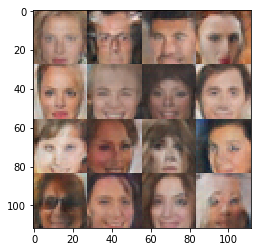

Epoch 2/5... Discriminator Loss: 1.1416... Generator Loss: 1.1290
Epoch 2/5... Discriminator Loss: 1.0338... Generator Loss: 0.8416
Epoch 2/5... Discriminator Loss: 1.1885... Generator Loss: 0.8148
Epoch 2/5... Discriminator Loss: 0.9073... Generator Loss: 0.9678
Epoch 2/5... Discriminator Loss: 1.1390... Generator Loss: 0.7253
Epoch 2/5... Discriminator Loss: 1.1504... Generator Loss: 0.7816
Epoch 2/5... Discriminator Loss: 1.2746... Generator Loss: 0.7557


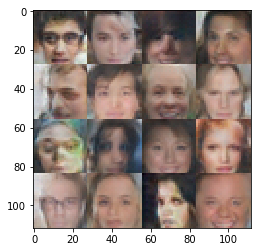

Epoch 2/5... Discriminator Loss: 1.2405... Generator Loss: 0.6774
Epoch 2/5... Discriminator Loss: 1.0444... Generator Loss: 1.0044
Epoch 2/5... Discriminator Loss: 1.2381... Generator Loss: 0.6373
Epoch 2/5... Discriminator Loss: 1.3560... Generator Loss: 0.8675
Epoch 2/5... Discriminator Loss: 1.2822... Generator Loss: 0.5971
Epoch 2/5... Discriminator Loss: 1.1515... Generator Loss: 0.8926
Epoch 2/5... Discriminator Loss: 0.9307... Generator Loss: 0.9372


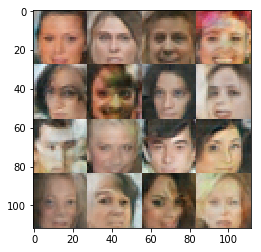

Epoch 2/5... Discriminator Loss: 1.1445... Generator Loss: 0.8697
Epoch 2/5... Discriminator Loss: 0.8870... Generator Loss: 1.2228
Epoch 2/5... Discriminator Loss: 1.1770... Generator Loss: 0.7708
Epoch 2/5... Discriminator Loss: 1.1841... Generator Loss: 0.8555
Epoch 2/5... Discriminator Loss: 1.0160... Generator Loss: 0.9683
Epoch 2/5... Discriminator Loss: 1.1675... Generator Loss: 0.7139


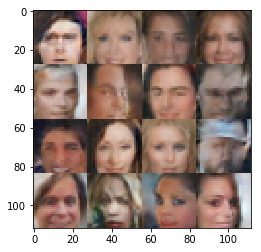

Epoch 2/5... Discriminator Loss: 1.1584... Generator Loss: 0.8473
Epoch 2/5... Discriminator Loss: 0.9659... Generator Loss: 1.1208
Epoch 2/5... Discriminator Loss: 1.2788... Generator Loss: 0.6280
Epoch 2/5... Discriminator Loss: 1.1404... Generator Loss: 0.7720
Epoch 2/5... Discriminator Loss: 1.1613... Generator Loss: 0.7087
Epoch 2/5... Discriminator Loss: 1.1549... Generator Loss: 0.7603
Epoch 2/5... Discriminator Loss: 0.9957... Generator Loss: 1.0182


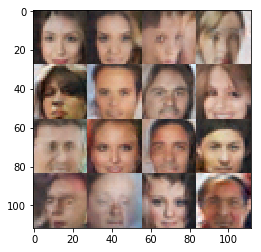

Epoch 2/5... Discriminator Loss: 1.0990... Generator Loss: 0.8652
Epoch 2/5... Discriminator Loss: 1.1232... Generator Loss: 0.8653
Epoch 2/5... Discriminator Loss: 1.3110... Generator Loss: 0.6433
Epoch 2/5... Discriminator Loss: 1.3302... Generator Loss: 0.6325
Epoch 2/5... Discriminator Loss: 1.5767... Generator Loss: 0.4008
Epoch 2/5... Discriminator Loss: 1.1957... Generator Loss: 0.6632
Epoch 2/5... Discriminator Loss: 1.3301... Generator Loss: 0.6172


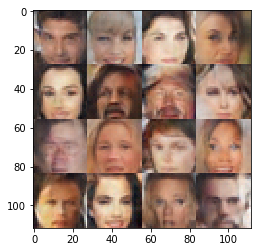

Epoch 2/5... Discriminator Loss: 1.4983... Generator Loss: 0.4678
Epoch 2/5... Discriminator Loss: 1.1419... Generator Loss: 0.7782
Epoch 2/5... Discriminator Loss: 0.9516... Generator Loss: 1.1132
Epoch 2/5... Discriminator Loss: 1.2379... Generator Loss: 0.6779
Epoch 2/5... Discriminator Loss: 1.1736... Generator Loss: 0.8519
Epoch 2/5... Discriminator Loss: 1.2795... Generator Loss: 0.5935


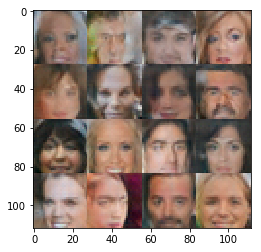

Epoch 2/5... Discriminator Loss: 1.3947... Generator Loss: 0.4811
Epoch 2/5... Discriminator Loss: 1.0946... Generator Loss: 0.7563
Epoch 2/5... Discriminator Loss: 1.2606... Generator Loss: 0.7064
Epoch 2/5... Discriminator Loss: 0.9928... Generator Loss: 0.9646
Epoch 2/5... Discriminator Loss: 1.4137... Generator Loss: 0.6615
Epoch 2/5... Discriminator Loss: 1.2262... Generator Loss: 0.7034
Epoch 2/5... Discriminator Loss: 1.2624... Generator Loss: 0.6650


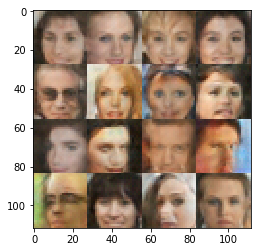

Epoch 2/5... Discriminator Loss: 1.0557... Generator Loss: 0.8657
Epoch 2/5... Discriminator Loss: 1.3935... Generator Loss: 0.6516
Epoch 2/5... Discriminator Loss: 1.0716... Generator Loss: 0.9296
Epoch 2/5... Discriminator Loss: 1.3672... Generator Loss: 0.5167
Epoch 2/5... Discriminator Loss: 1.3529... Generator Loss: 0.5311
Epoch 2/5... Discriminator Loss: 1.2104... Generator Loss: 0.7124
Epoch 2/5... Discriminator Loss: 1.0512... Generator Loss: 1.1497


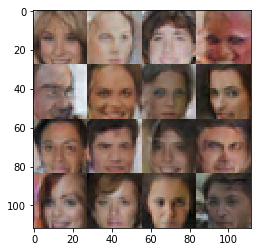

Epoch 2/5... Discriminator Loss: 1.0509... Generator Loss: 0.8406
Epoch 2/5... Discriminator Loss: 1.4201... Generator Loss: 0.5455
Epoch 2/5... Discriminator Loss: 1.2735... Generator Loss: 0.5878
Epoch 2/5... Discriminator Loss: 1.0017... Generator Loss: 1.0004
Epoch 2/5... Discriminator Loss: 1.0052... Generator Loss: 1.4832
Epoch 2/5... Discriminator Loss: 1.4231... Generator Loss: 0.4799


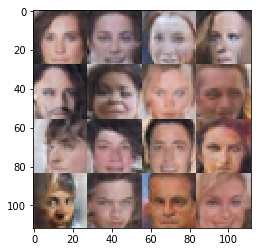

Epoch 2/5... Discriminator Loss: 1.0197... Generator Loss: 1.1914
Epoch 2/5... Discriminator Loss: 1.1262... Generator Loss: 0.7860
Epoch 2/5... Discriminator Loss: 1.0639... Generator Loss: 0.8745
Epoch 2/5... Discriminator Loss: 1.1909... Generator Loss: 1.2806
Epoch 2/5... Discriminator Loss: 1.5996... Generator Loss: 0.4170
Epoch 2/5... Discriminator Loss: 1.1104... Generator Loss: 0.8548
Epoch 2/5... Discriminator Loss: 1.2033... Generator Loss: 0.7664


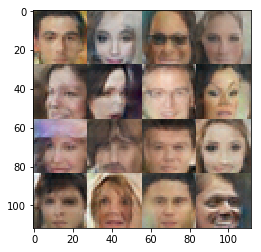

Epoch 2/5... Discriminator Loss: 1.1667... Generator Loss: 0.8948
Epoch 2/5... Discriminator Loss: 1.1200... Generator Loss: 0.8195
Epoch 2/5... Discriminator Loss: 1.4421... Generator Loss: 0.5055
Epoch 2/5... Discriminator Loss: 0.9957... Generator Loss: 1.3442
Epoch 2/5... Discriminator Loss: 1.2788... Generator Loss: 0.6224
Epoch 2/5... Discriminator Loss: 0.9766... Generator Loss: 1.0698
Epoch 2/5... Discriminator Loss: 1.1379... Generator Loss: 0.8353


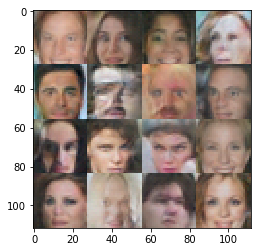

Epoch 2/5... Discriminator Loss: 1.0496... Generator Loss: 0.8699
Epoch 2/5... Discriminator Loss: 1.3788... Generator Loss: 1.0196
Epoch 2/5... Discriminator Loss: 1.0849... Generator Loss: 0.9987
Epoch 2/5... Discriminator Loss: 1.0857... Generator Loss: 1.0552
Epoch 2/5... Discriminator Loss: 0.8924... Generator Loss: 1.2048
Epoch 2/5... Discriminator Loss: 1.1674... Generator Loss: 0.7158


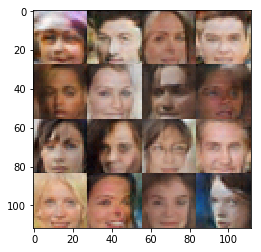

Epoch 2/5... Discriminator Loss: 1.2874... Generator Loss: 0.6239
Epoch 2/5... Discriminator Loss: 1.1314... Generator Loss: 0.8337
Epoch 2/5... Discriminator Loss: 1.1274... Generator Loss: 0.8055
Epoch 2/5... Discriminator Loss: 1.1804... Generator Loss: 0.8143
Epoch 2/5... Discriminator Loss: 1.1289... Generator Loss: 0.8377
Epoch 2/5... Discriminator Loss: 1.3624... Generator Loss: 0.6411
Epoch 2/5... Discriminator Loss: 0.9656... Generator Loss: 1.2249


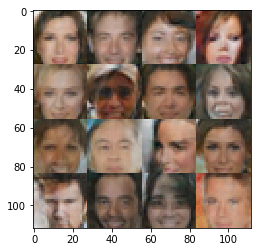

Epoch 2/5... Discriminator Loss: 0.9358... Generator Loss: 1.0835
Epoch 2/5... Discriminator Loss: 1.0608... Generator Loss: 0.9057
Epoch 2/5... Discriminator Loss: 0.9911... Generator Loss: 0.9285
Epoch 2/5... Discriminator Loss: 1.0826... Generator Loss: 0.8768
Epoch 2/5... Discriminator Loss: 1.2683... Generator Loss: 0.7956
Epoch 2/5... Discriminator Loss: 1.1721... Generator Loss: 0.7265
Epoch 2/5... Discriminator Loss: 1.3532... Generator Loss: 0.4938


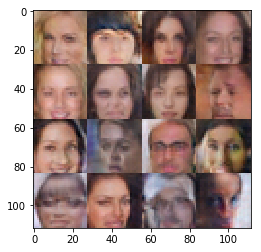

Epoch 2/5... Discriminator Loss: 1.4639... Generator Loss: 0.4720
Epoch 2/5... Discriminator Loss: 1.3485... Generator Loss: 0.5825
Epoch 2/5... Discriminator Loss: 1.0344... Generator Loss: 0.8826
Epoch 2/5... Discriminator Loss: 1.0387... Generator Loss: 1.0374
Epoch 2/5... Discriminator Loss: 1.2072... Generator Loss: 0.7552
Epoch 2/5... Discriminator Loss: 1.1744... Generator Loss: 0.8673


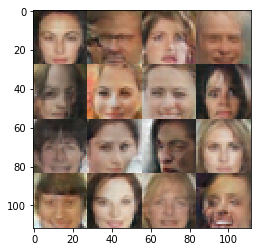

Epoch 2/5... Discriminator Loss: 0.9361... Generator Loss: 1.0647
Epoch 2/5... Discriminator Loss: 1.1499... Generator Loss: 0.7285
Epoch 2/5... Discriminator Loss: 1.5749... Generator Loss: 0.4173
Epoch 2/5... Discriminator Loss: 1.0301... Generator Loss: 0.8283
Epoch 2/5... Discriminator Loss: 1.1669... Generator Loss: 1.3080
Epoch 2/5... Discriminator Loss: 1.3161... Generator Loss: 0.5359
Epoch 2/5... Discriminator Loss: 1.1943... Generator Loss: 0.7555


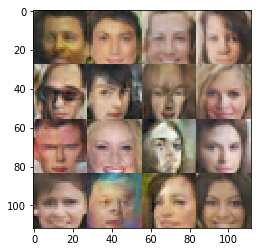

Epoch 2/5... Discriminator Loss: 1.1830... Generator Loss: 0.7083
Epoch 2/5... Discriminator Loss: 1.1128... Generator Loss: 0.9958
Epoch 2/5... Discriminator Loss: 1.1574... Generator Loss: 0.7334
Epoch 2/5... Discriminator Loss: 0.9044... Generator Loss: 1.0533
Epoch 2/5... Discriminator Loss: 1.0689... Generator Loss: 1.2286
Epoch 2/5... Discriminator Loss: 1.1689... Generator Loss: 0.7601
Epoch 2/5... Discriminator Loss: 0.9717... Generator Loss: 1.1885


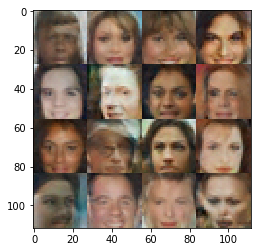

Epoch 2/5... Discriminator Loss: 0.8781... Generator Loss: 1.1980
Epoch 2/5... Discriminator Loss: 1.0463... Generator Loss: 1.0032
Epoch 3/5... Discriminator Loss: 1.4721... Generator Loss: 0.4456


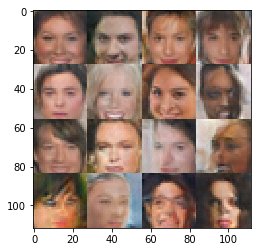

Epoch 3/5... Discriminator Loss: 1.1457... Generator Loss: 1.0895
Epoch 3/5... Discriminator Loss: 0.9800... Generator Loss: 1.0743
Epoch 3/5... Discriminator Loss: 1.0488... Generator Loss: 1.1547
Epoch 3/5... Discriminator Loss: 1.4891... Generator Loss: 0.4764
Epoch 3/5... Discriminator Loss: 1.2892... Generator Loss: 0.5860
Epoch 3/5... Discriminator Loss: 1.4435... Generator Loss: 0.4782


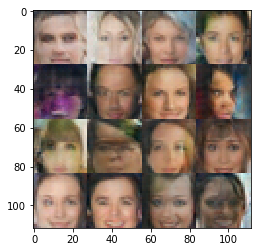

Epoch 3/5... Discriminator Loss: 1.0100... Generator Loss: 1.0525
Epoch 3/5... Discriminator Loss: 1.1749... Generator Loss: 0.7434
Epoch 3/5... Discriminator Loss: 1.1039... Generator Loss: 0.7799
Epoch 3/5... Discriminator Loss: 1.2442... Generator Loss: 0.6354
Epoch 3/5... Discriminator Loss: 1.0351... Generator Loss: 1.0609
Epoch 3/5... Discriminator Loss: 0.9634... Generator Loss: 0.9776
Epoch 3/5... Discriminator Loss: 1.0999... Generator Loss: 0.7699


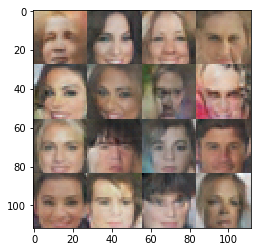

Epoch 3/5... Discriminator Loss: 1.1556... Generator Loss: 0.8973
Epoch 3/5... Discriminator Loss: 1.3177... Generator Loss: 0.5430
Epoch 3/5... Discriminator Loss: 1.3353... Generator Loss: 0.5753
Epoch 3/5... Discriminator Loss: 1.0289... Generator Loss: 1.0283
Epoch 3/5... Discriminator Loss: 1.4651... Generator Loss: 0.4726
Epoch 3/5... Discriminator Loss: 1.3688... Generator Loss: 0.5414
Epoch 3/5... Discriminator Loss: 1.0951... Generator Loss: 0.7641


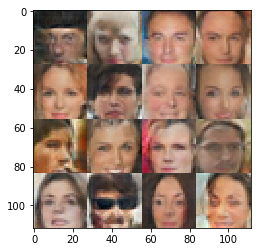

Epoch 3/5... Discriminator Loss: 1.2439... Generator Loss: 0.7019
Epoch 3/5... Discriminator Loss: 1.0646... Generator Loss: 0.9245
Epoch 3/5... Discriminator Loss: 1.3043... Generator Loss: 0.6614
Epoch 3/5... Discriminator Loss: 1.1184... Generator Loss: 0.9704
Epoch 3/5... Discriminator Loss: 1.2347... Generator Loss: 0.9883
Epoch 3/5... Discriminator Loss: 1.3365... Generator Loss: 0.5643


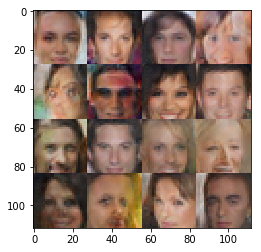

Epoch 3/5... Discriminator Loss: 1.5127... Generator Loss: 0.4446
Epoch 3/5... Discriminator Loss: 1.6355... Generator Loss: 0.3919
Epoch 3/5... Discriminator Loss: 1.0644... Generator Loss: 0.9559
Epoch 3/5... Discriminator Loss: 1.0723... Generator Loss: 0.8958
Epoch 3/5... Discriminator Loss: 1.2533... Generator Loss: 0.7083
Epoch 3/5... Discriminator Loss: 1.0619... Generator Loss: 1.1408
Epoch 3/5... Discriminator Loss: 1.3242... Generator Loss: 0.5991


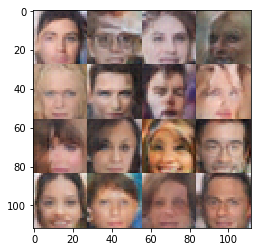

Epoch 3/5... Discriminator Loss: 1.4507... Generator Loss: 0.4858
Epoch 3/5... Discriminator Loss: 1.2365... Generator Loss: 0.7552
Epoch 3/5... Discriminator Loss: 1.2065... Generator Loss: 0.6372
Epoch 3/5... Discriminator Loss: 0.8879... Generator Loss: 1.3866
Epoch 3/5... Discriminator Loss: 1.0185... Generator Loss: 0.9076
Epoch 3/5... Discriminator Loss: 1.0191... Generator Loss: 1.1498
Epoch 3/5... Discriminator Loss: 1.0973... Generator Loss: 1.0773


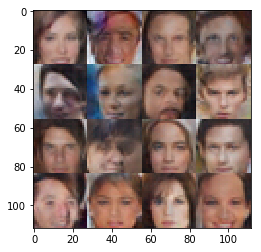

Epoch 3/5... Discriminator Loss: 0.9232... Generator Loss: 1.1647
Epoch 3/5... Discriminator Loss: 1.2223... Generator Loss: 0.6388
Epoch 3/5... Discriminator Loss: 1.4457... Generator Loss: 0.4770
Epoch 3/5... Discriminator Loss: 1.1499... Generator Loss: 1.1231
Epoch 3/5... Discriminator Loss: 0.8625... Generator Loss: 1.1007
Epoch 3/5... Discriminator Loss: 1.2505... Generator Loss: 0.6505


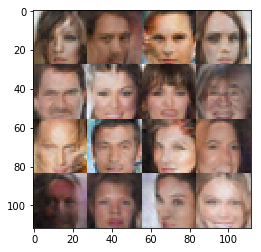

Epoch 3/5... Discriminator Loss: 1.1705... Generator Loss: 0.7085
Epoch 3/5... Discriminator Loss: 1.1791... Generator Loss: 0.6567
Epoch 3/5... Discriminator Loss: 1.1988... Generator Loss: 0.6873
Epoch 3/5... Discriminator Loss: 1.1153... Generator Loss: 0.7261
Epoch 3/5... Discriminator Loss: 1.4111... Generator Loss: 0.5268
Epoch 3/5... Discriminator Loss: 1.1064... Generator Loss: 0.7595
Epoch 3/5... Discriminator Loss: 1.5400... Generator Loss: 0.4490


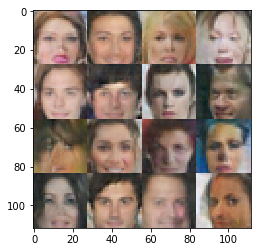

Epoch 3/5... Discriminator Loss: 1.1671... Generator Loss: 0.7882
Epoch 3/5... Discriminator Loss: 0.9047... Generator Loss: 1.6139
Epoch 3/5... Discriminator Loss: 1.9761... Generator Loss: 0.2556
Epoch 3/5... Discriminator Loss: 1.4148... Generator Loss: 0.7648
Epoch 3/5... Discriminator Loss: 1.2179... Generator Loss: 0.6613
Epoch 3/5... Discriminator Loss: 1.0766... Generator Loss: 0.8535
Epoch 3/5... Discriminator Loss: 0.9522... Generator Loss: 1.0143


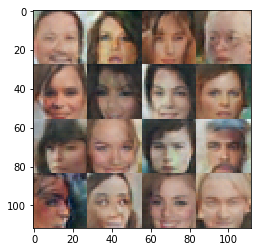

Epoch 3/5... Discriminator Loss: 1.3802... Generator Loss: 0.7732
Epoch 3/5... Discriminator Loss: 1.0453... Generator Loss: 1.0246
Epoch 3/5... Discriminator Loss: 1.1916... Generator Loss: 0.6529
Epoch 3/5... Discriminator Loss: 1.0927... Generator Loss: 0.7762
Epoch 3/5... Discriminator Loss: 1.2817... Generator Loss: 0.6004
Epoch 3/5... Discriminator Loss: 0.9754... Generator Loss: 1.0403


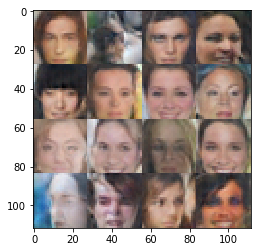

Epoch 3/5... Discriminator Loss: 1.2431... Generator Loss: 0.6888
Epoch 3/5... Discriminator Loss: 1.3405... Generator Loss: 0.6014
Epoch 3/5... Discriminator Loss: 1.3655... Generator Loss: 0.5331
Epoch 3/5... Discriminator Loss: 1.1269... Generator Loss: 0.8257
Epoch 3/5... Discriminator Loss: 1.3736... Generator Loss: 0.5261
Epoch 3/5... Discriminator Loss: 1.2406... Generator Loss: 0.7639
Epoch 3/5... Discriminator Loss: 1.0960... Generator Loss: 0.8002


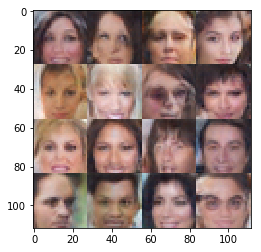

Epoch 3/5... Discriminator Loss: 1.0383... Generator Loss: 1.1098
Epoch 3/5... Discriminator Loss: 1.1606... Generator Loss: 0.7738
Epoch 3/5... Discriminator Loss: 1.1574... Generator Loss: 0.8603
Epoch 3/5... Discriminator Loss: 1.0931... Generator Loss: 0.8464
Epoch 3/5... Discriminator Loss: 1.6565... Generator Loss: 0.3586
Epoch 3/5... Discriminator Loss: 1.3467... Generator Loss: 0.6158
Epoch 3/5... Discriminator Loss: 1.3157... Generator Loss: 0.5833


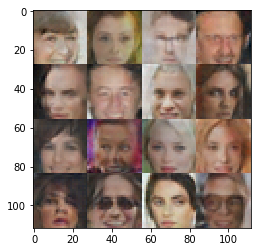

Epoch 3/5... Discriminator Loss: 0.9854... Generator Loss: 0.9585
Epoch 3/5... Discriminator Loss: 1.0325... Generator Loss: 0.9357
Epoch 3/5... Discriminator Loss: 0.9577... Generator Loss: 0.9576
Epoch 3/5... Discriminator Loss: 0.9589... Generator Loss: 1.2033
Epoch 3/5... Discriminator Loss: 1.1267... Generator Loss: 1.0050
Epoch 3/5... Discriminator Loss: 1.1620... Generator Loss: 0.7212


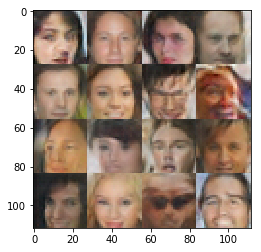

Epoch 3/5... Discriminator Loss: 0.9871... Generator Loss: 0.9289
Epoch 3/5... Discriminator Loss: 0.9510... Generator Loss: 1.0064
Epoch 3/5... Discriminator Loss: 1.0869... Generator Loss: 0.8990
Epoch 3/5... Discriminator Loss: 1.1298... Generator Loss: 0.9249
Epoch 3/5... Discriminator Loss: 1.1082... Generator Loss: 0.7147
Epoch 3/5... Discriminator Loss: 1.1131... Generator Loss: 0.7868
Epoch 3/5... Discriminator Loss: 0.9173... Generator Loss: 0.9728


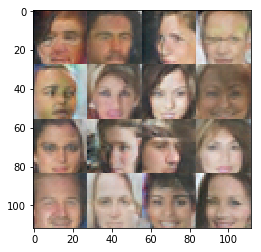

Epoch 3/5... Discriminator Loss: 1.1733... Generator Loss: 0.7841
Epoch 3/5... Discriminator Loss: 1.2113... Generator Loss: 0.7444
Epoch 3/5... Discriminator Loss: 1.3396... Generator Loss: 0.6242
Epoch 3/5... Discriminator Loss: 1.2344... Generator Loss: 0.7258
Epoch 3/5... Discriminator Loss: 1.1451... Generator Loss: 1.8354
Epoch 3/5... Discriminator Loss: 1.2183... Generator Loss: 0.7596
Epoch 3/5... Discriminator Loss: 1.2998... Generator Loss: 0.5614


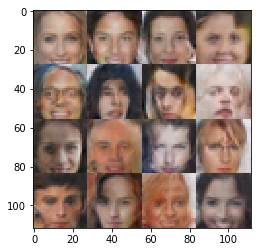

Epoch 3/5... Discriminator Loss: 0.9787... Generator Loss: 1.2702
Epoch 3/5... Discriminator Loss: 0.9541... Generator Loss: 0.9934
Epoch 3/5... Discriminator Loss: 1.2963... Generator Loss: 0.7128
Epoch 3/5... Discriminator Loss: 1.2147... Generator Loss: 0.6779
Epoch 3/5... Discriminator Loss: 1.0891... Generator Loss: 0.7403
Epoch 3/5... Discriminator Loss: 1.2631... Generator Loss: 0.7215


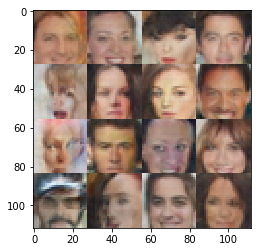

Epoch 3/5... Discriminator Loss: 1.1596... Generator Loss: 0.7530
Epoch 3/5... Discriminator Loss: 1.0934... Generator Loss: 0.8332
Epoch 3/5... Discriminator Loss: 1.1496... Generator Loss: 0.7035
Epoch 3/5... Discriminator Loss: 1.2165... Generator Loss: 0.6352
Epoch 3/5... Discriminator Loss: 0.7764... Generator Loss: 1.5328
Epoch 3/5... Discriminator Loss: 1.1457... Generator Loss: 0.7749
Epoch 3/5... Discriminator Loss: 1.3551... Generator Loss: 0.6671


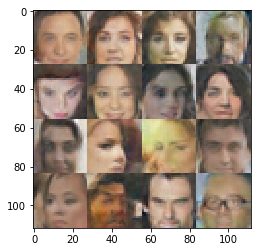

Epoch 3/5... Discriminator Loss: 1.4483... Generator Loss: 0.5198
Epoch 3/5... Discriminator Loss: 0.9589... Generator Loss: 0.9547
Epoch 3/5... Discriminator Loss: 0.9967... Generator Loss: 1.0406
Epoch 3/5... Discriminator Loss: 1.2438... Generator Loss: 0.6906
Epoch 3/5... Discriminator Loss: 1.3096... Generator Loss: 0.6215
Epoch 3/5... Discriminator Loss: 1.4576... Generator Loss: 0.4485
Epoch 3/5... Discriminator Loss: 0.8368... Generator Loss: 1.1627


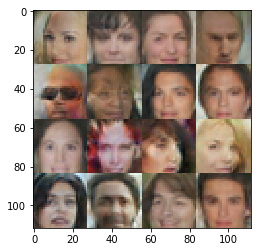

Epoch 3/5... Discriminator Loss: 1.4590... Generator Loss: 0.5182
Epoch 3/5... Discriminator Loss: 1.2750... Generator Loss: 0.6332
Epoch 3/5... Discriminator Loss: 1.0627... Generator Loss: 1.0292
Epoch 3/5... Discriminator Loss: 1.3669... Generator Loss: 0.5678
Epoch 3/5... Discriminator Loss: 1.0646... Generator Loss: 0.8309
Epoch 3/5... Discriminator Loss: 1.0864... Generator Loss: 0.8409


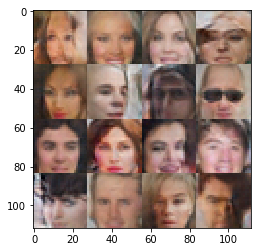

Epoch 3/5... Discriminator Loss: 0.9213... Generator Loss: 1.1061
Epoch 3/5... Discriminator Loss: 1.0343... Generator Loss: 0.9781
Epoch 3/5... Discriminator Loss: 1.2666... Generator Loss: 0.5701
Epoch 3/5... Discriminator Loss: 1.2512... Generator Loss: 0.6558
Epoch 3/5... Discriminator Loss: 1.0846... Generator Loss: 0.8192
Epoch 3/5... Discriminator Loss: 1.4238... Generator Loss: 0.5475
Epoch 3/5... Discriminator Loss: 1.0150... Generator Loss: 1.0546


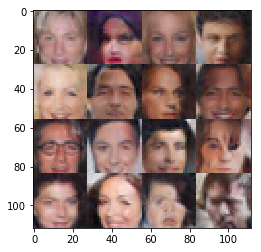

Epoch 3/5... Discriminator Loss: 1.1843... Generator Loss: 0.8548
Epoch 3/5... Discriminator Loss: 1.0833... Generator Loss: 1.0559
Epoch 3/5... Discriminator Loss: 1.0261... Generator Loss: 0.8328
Epoch 3/5... Discriminator Loss: 1.3371... Generator Loss: 0.5660
Epoch 3/5... Discriminator Loss: 1.3585... Generator Loss: 0.6276
Epoch 3/5... Discriminator Loss: 1.2209... Generator Loss: 0.7737
Epoch 3/5... Discriminator Loss: 1.1756... Generator Loss: 0.7127


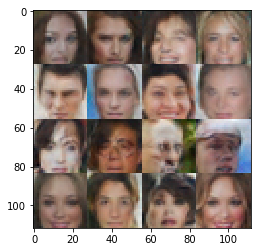

Epoch 3/5... Discriminator Loss: 1.0053... Generator Loss: 0.9417
Epoch 3/5... Discriminator Loss: 0.9673... Generator Loss: 1.3163
Epoch 3/5... Discriminator Loss: 1.1335... Generator Loss: 0.7626
Epoch 3/5... Discriminator Loss: 1.0031... Generator Loss: 1.1398
Epoch 3/5... Discriminator Loss: 1.0759... Generator Loss: 1.0075
Epoch 3/5... Discriminator Loss: 1.1120... Generator Loss: 0.9335


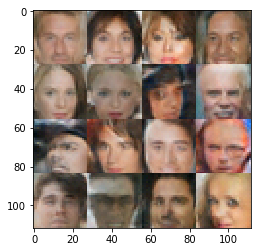

Epoch 3/5... Discriminator Loss: 0.9544... Generator Loss: 1.4041
Epoch 3/5... Discriminator Loss: 1.3493... Generator Loss: 1.5981
Epoch 3/5... Discriminator Loss: 0.8213... Generator Loss: 1.3147
Epoch 3/5... Discriminator Loss: 1.2462... Generator Loss: 0.6352
Epoch 3/5... Discriminator Loss: 1.2205... Generator Loss: 0.6761
Epoch 3/5... Discriminator Loss: 1.1873... Generator Loss: 0.7503
Epoch 3/5... Discriminator Loss: 1.1988... Generator Loss: 0.6559


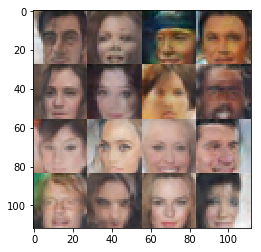

Epoch 3/5... Discriminator Loss: 1.4370... Generator Loss: 0.5631
Epoch 3/5... Discriminator Loss: 0.9838... Generator Loss: 1.1181
Epoch 3/5... Discriminator Loss: 1.0280... Generator Loss: 0.9059
Epoch 3/5... Discriminator Loss: 0.9468... Generator Loss: 1.0594
Epoch 3/5... Discriminator Loss: 1.2866... Generator Loss: 0.7212
Epoch 3/5... Discriminator Loss: 1.6285... Generator Loss: 0.3786
Epoch 3/5... Discriminator Loss: 1.2495... Generator Loss: 0.6474


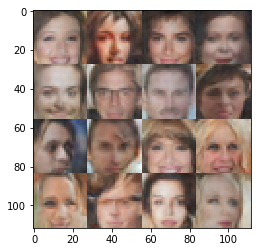

Epoch 3/5... Discriminator Loss: 1.3050... Generator Loss: 0.6186
Epoch 3/5... Discriminator Loss: 1.2587... Generator Loss: 0.7998
Epoch 3/5... Discriminator Loss: 1.1456... Generator Loss: 0.7028
Epoch 3/5... Discriminator Loss: 1.2016... Generator Loss: 1.4463
Epoch 3/5... Discriminator Loss: 1.2872... Generator Loss: 0.6097
Epoch 3/5... Discriminator Loss: 0.9346... Generator Loss: 1.2302


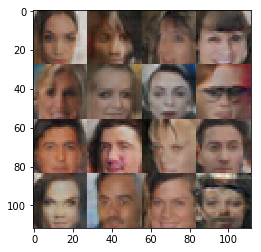

Epoch 3/5... Discriminator Loss: 0.8857... Generator Loss: 1.6092
Epoch 3/5... Discriminator Loss: 1.3165... Generator Loss: 0.6008
Epoch 3/5... Discriminator Loss: 1.0867... Generator Loss: 1.0213
Epoch 3/5... Discriminator Loss: 0.9477... Generator Loss: 0.9227
Epoch 3/5... Discriminator Loss: 1.0898... Generator Loss: 1.0099
Epoch 3/5... Discriminator Loss: 1.0461... Generator Loss: 0.9317
Epoch 3/5... Discriminator Loss: 1.2058... Generator Loss: 0.7451


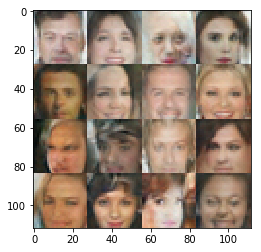

Epoch 3/5... Discriminator Loss: 1.1751... Generator Loss: 1.0250
Epoch 3/5... Discriminator Loss: 1.2925... Generator Loss: 0.6653
Epoch 3/5... Discriminator Loss: 1.0685... Generator Loss: 0.9095
Epoch 3/5... Discriminator Loss: 1.1199... Generator Loss: 0.7465
Epoch 3/5... Discriminator Loss: 1.0538... Generator Loss: 0.9254
Epoch 3/5... Discriminator Loss: 1.1484... Generator Loss: 0.6696
Epoch 3/5... Discriminator Loss: 1.3212... Generator Loss: 0.5981


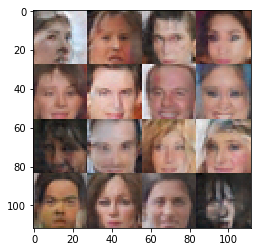

Epoch 3/5... Discriminator Loss: 0.9091... Generator Loss: 1.0806
Epoch 3/5... Discriminator Loss: 0.9104... Generator Loss: 1.1947
Epoch 3/5... Discriminator Loss: 1.5098... Generator Loss: 0.4554
Epoch 3/5... Discriminator Loss: 1.3138... Generator Loss: 0.6137
Epoch 3/5... Discriminator Loss: 1.3736... Generator Loss: 0.6008
Epoch 3/5... Discriminator Loss: 1.0982... Generator Loss: 0.7710


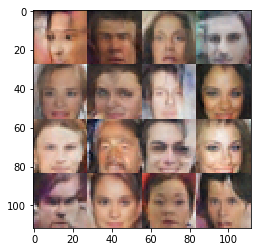

Epoch 3/5... Discriminator Loss: 1.3322... Generator Loss: 0.5767
Epoch 3/5... Discriminator Loss: 0.9786... Generator Loss: 0.9332
Epoch 3/5... Discriminator Loss: 1.4753... Generator Loss: 0.4873
Epoch 3/5... Discriminator Loss: 1.5742... Generator Loss: 0.4042
Epoch 3/5... Discriminator Loss: 1.1518... Generator Loss: 0.7000
Epoch 3/5... Discriminator Loss: 1.0798... Generator Loss: 0.8493
Epoch 3/5... Discriminator Loss: 1.1059... Generator Loss: 0.7311


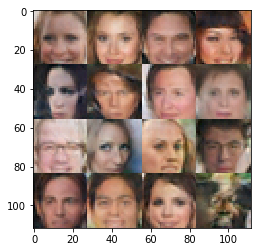

Epoch 3/5... Discriminator Loss: 0.9654... Generator Loss: 1.0337
Epoch 3/5... Discriminator Loss: 1.0544... Generator Loss: 0.8871
Epoch 3/5... Discriminator Loss: 0.8332... Generator Loss: 1.1351
Epoch 3/5... Discriminator Loss: 0.9089... Generator Loss: 1.1725
Epoch 3/5... Discriminator Loss: 1.2114... Generator Loss: 0.7827
Epoch 3/5... Discriminator Loss: 0.9325... Generator Loss: 1.1467
Epoch 3/5... Discriminator Loss: 1.2165... Generator Loss: 0.6881


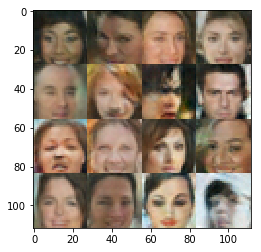

Epoch 3/5... Discriminator Loss: 1.0205... Generator Loss: 0.8954
Epoch 3/5... Discriminator Loss: 0.9928... Generator Loss: 0.9195
Epoch 3/5... Discriminator Loss: 1.4510... Generator Loss: 0.5187
Epoch 3/5... Discriminator Loss: 1.2280... Generator Loss: 0.7006
Epoch 3/5... Discriminator Loss: 1.0779... Generator Loss: 0.8499
Epoch 3/5... Discriminator Loss: 0.9801... Generator Loss: 1.0518


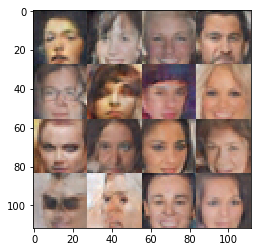

Epoch 3/5... Discriminator Loss: 1.4645... Generator Loss: 0.4822
Epoch 3/5... Discriminator Loss: 1.1888... Generator Loss: 1.5024
Epoch 3/5... Discriminator Loss: 1.1964... Generator Loss: 0.6705
Epoch 3/5... Discriminator Loss: 1.0211... Generator Loss: 0.9670
Epoch 3/5... Discriminator Loss: 0.9793... Generator Loss: 1.1507
Epoch 3/5... Discriminator Loss: 1.0808... Generator Loss: 0.8237
Epoch 3/5... Discriminator Loss: 1.2022... Generator Loss: 0.6406


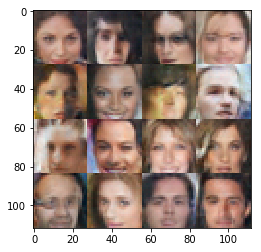

Epoch 3/5... Discriminator Loss: 1.0225... Generator Loss: 0.9741
Epoch 3/5... Discriminator Loss: 1.1724... Generator Loss: 0.7612
Epoch 3/5... Discriminator Loss: 0.9985... Generator Loss: 0.9830
Epoch 3/5... Discriminator Loss: 1.0058... Generator Loss: 1.0871
Epoch 3/5... Discriminator Loss: 1.0691... Generator Loss: 0.9072
Epoch 3/5... Discriminator Loss: 1.1481... Generator Loss: 0.7820
Epoch 3/5... Discriminator Loss: 0.9809... Generator Loss: 1.0509


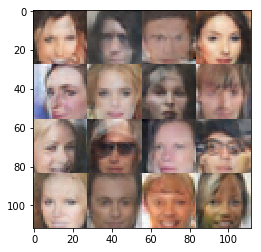

Epoch 3/5... Discriminator Loss: 0.7651... Generator Loss: 1.4666
Epoch 3/5... Discriminator Loss: 1.3637... Generator Loss: 0.5475
Epoch 3/5... Discriminator Loss: 1.2347... Generator Loss: 1.4717
Epoch 3/5... Discriminator Loss: 0.9069... Generator Loss: 1.3707
Epoch 3/5... Discriminator Loss: 1.2211... Generator Loss: 0.6752
Epoch 3/5... Discriminator Loss: 1.0145... Generator Loss: 0.8775


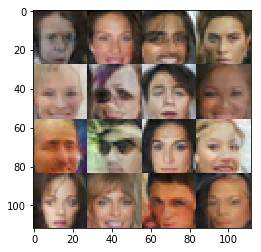

Epoch 3/5... Discriminator Loss: 0.8650... Generator Loss: 1.0802
Epoch 3/5... Discriminator Loss: 1.3744... Generator Loss: 0.5900
Epoch 3/5... Discriminator Loss: 1.2957... Generator Loss: 0.5879
Epoch 3/5... Discriminator Loss: 0.9172... Generator Loss: 1.0593
Epoch 3/5... Discriminator Loss: 0.8063... Generator Loss: 1.2242
Epoch 3/5... Discriminator Loss: 1.2216... Generator Loss: 0.7175
Epoch 3/5... Discriminator Loss: 1.0061... Generator Loss: 1.0819


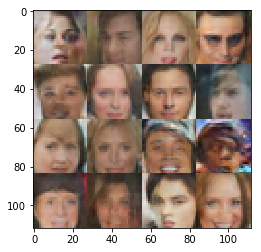

Epoch 3/5... Discriminator Loss: 1.0298... Generator Loss: 0.8490
Epoch 3/5... Discriminator Loss: 1.0997... Generator Loss: 0.8719
Epoch 3/5... Discriminator Loss: 1.0511... Generator Loss: 0.8987
Epoch 3/5... Discriminator Loss: 0.8367... Generator Loss: 1.5858
Epoch 3/5... Discriminator Loss: 1.0742... Generator Loss: 0.8863
Epoch 3/5... Discriminator Loss: 1.1674... Generator Loss: 0.7914
Epoch 3/5... Discriminator Loss: 1.5126... Generator Loss: 0.4537


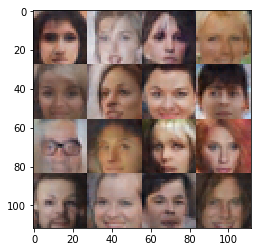

Epoch 3/5... Discriminator Loss: 0.8912... Generator Loss: 1.6953
Epoch 3/5... Discriminator Loss: 1.7305... Generator Loss: 0.3354
Epoch 3/5... Discriminator Loss: 1.1217... Generator Loss: 0.7872
Epoch 3/5... Discriminator Loss: 1.0876... Generator Loss: 0.8114
Epoch 3/5... Discriminator Loss: 1.4459... Generator Loss: 0.4986
Epoch 3/5... Discriminator Loss: 1.4029... Generator Loss: 0.5327


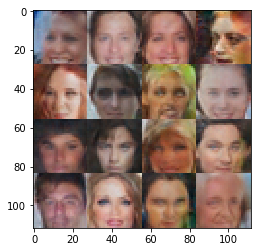

Epoch 3/5... Discriminator Loss: 1.6538... Generator Loss: 0.3766
Epoch 3/5... Discriminator Loss: 1.2584... Generator Loss: 0.6814
Epoch 3/5... Discriminator Loss: 1.5413... Generator Loss: 0.4727
Epoch 3/5... Discriminator Loss: 0.8951... Generator Loss: 1.1918
Epoch 3/5... Discriminator Loss: 1.0610... Generator Loss: 1.0497
Epoch 3/5... Discriminator Loss: 1.1684... Generator Loss: 0.6887
Epoch 3/5... Discriminator Loss: 0.9242... Generator Loss: 1.2213


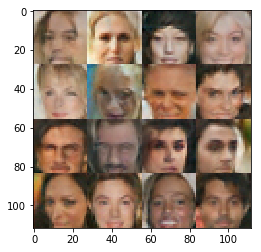

Epoch 3/5... Discriminator Loss: 0.7859... Generator Loss: 1.4348
Epoch 3/5... Discriminator Loss: 1.2126... Generator Loss: 0.6322
Epoch 3/5... Discriminator Loss: 1.1447... Generator Loss: 0.8191
Epoch 3/5... Discriminator Loss: 1.2450... Generator Loss: 0.6405
Epoch 3/5... Discriminator Loss: 1.0500... Generator Loss: 0.8372
Epoch 3/5... Discriminator Loss: 1.0571... Generator Loss: 0.8064
Epoch 3/5... Discriminator Loss: 0.8846... Generator Loss: 1.2970


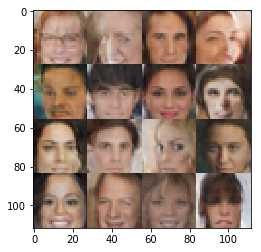

Epoch 3/5... Discriminator Loss: 1.1660... Generator Loss: 0.7557
Epoch 3/5... Discriminator Loss: 1.1729... Generator Loss: 0.8398
Epoch 3/5... Discriminator Loss: 0.7202... Generator Loss: 1.6609
Epoch 3/5... Discriminator Loss: 1.1583... Generator Loss: 0.7257
Epoch 3/5... Discriminator Loss: 0.8006... Generator Loss: 1.4158
Epoch 3/5... Discriminator Loss: 0.8353... Generator Loss: 1.2339


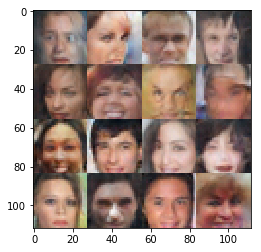

Epoch 3/5... Discriminator Loss: 1.1018... Generator Loss: 0.8619
Epoch 3/5... Discriminator Loss: 0.8810... Generator Loss: 1.2925
Epoch 3/5... Discriminator Loss: 1.3082... Generator Loss: 0.5732
Epoch 3/5... Discriminator Loss: 0.8026... Generator Loss: 1.3122
Epoch 3/5... Discriminator Loss: 1.3172... Generator Loss: 0.5825
Epoch 3/5... Discriminator Loss: 1.0078... Generator Loss: 0.9349
Epoch 3/5... Discriminator Loss: 1.1192... Generator Loss: 0.9316


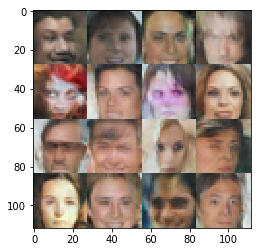

Epoch 3/5... Discriminator Loss: 1.2408... Generator Loss: 0.7544
Epoch 3/5... Discriminator Loss: 0.8319... Generator Loss: 1.5961
Epoch 3/5... Discriminator Loss: 1.3160... Generator Loss: 0.5298
Epoch 3/5... Discriminator Loss: 1.5608... Generator Loss: 0.4474
Epoch 3/5... Discriminator Loss: 0.9441... Generator Loss: 1.1349
Epoch 3/5... Discriminator Loss: 1.1421... Generator Loss: 0.8162
Epoch 3/5... Discriminator Loss: 2.1778... Generator Loss: 0.2493


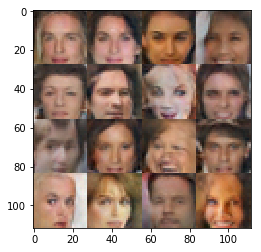

Epoch 3/5... Discriminator Loss: 1.0898... Generator Loss: 0.8624
Epoch 3/5... Discriminator Loss: 0.8891... Generator Loss: 1.1941
Epoch 3/5... Discriminator Loss: 0.9988... Generator Loss: 1.1715
Epoch 3/5... Discriminator Loss: 1.1674... Generator Loss: 0.7336
Epoch 3/5... Discriminator Loss: 0.7579... Generator Loss: 1.4301
Epoch 3/5... Discriminator Loss: 0.9629... Generator Loss: 1.0693


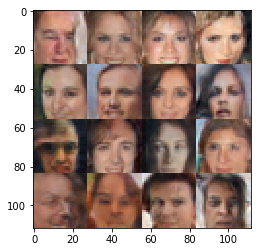

Epoch 3/5... Discriminator Loss: 1.0718... Generator Loss: 0.7943
Epoch 3/5... Discriminator Loss: 1.4043... Generator Loss: 0.5260
Epoch 3/5... Discriminator Loss: 1.0278... Generator Loss: 0.9761
Epoch 3/5... Discriminator Loss: 1.7905... Generator Loss: 0.3421
Epoch 3/5... Discriminator Loss: 0.8722... Generator Loss: 1.4109
Epoch 3/5... Discriminator Loss: 0.8035... Generator Loss: 1.7558
Epoch 3/5... Discriminator Loss: 0.9920... Generator Loss: 1.0222


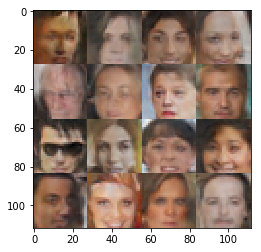

Epoch 3/5... Discriminator Loss: 1.1391... Generator Loss: 0.7876
Epoch 3/5... Discriminator Loss: 1.1272... Generator Loss: 0.7298
Epoch 3/5... Discriminator Loss: 1.0735... Generator Loss: 0.9204
Epoch 3/5... Discriminator Loss: 1.1017... Generator Loss: 0.7536
Epoch 3/5... Discriminator Loss: 1.0516... Generator Loss: 0.8111
Epoch 3/5... Discriminator Loss: 1.2669... Generator Loss: 0.5986
Epoch 3/5... Discriminator Loss: 0.8180... Generator Loss: 1.2352


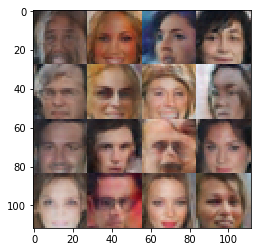

Epoch 3/5... Discriminator Loss: 3.6161... Generator Loss: 3.2398
Epoch 3/5... Discriminator Loss: 0.9548... Generator Loss: 1.0752
Epoch 3/5... Discriminator Loss: 1.1114... Generator Loss: 0.7866
Epoch 3/5... Discriminator Loss: 1.0489... Generator Loss: 1.5216
Epoch 3/5... Discriminator Loss: 0.9814... Generator Loss: 1.4467
Epoch 3/5... Discriminator Loss: 1.0630... Generator Loss: 0.7679


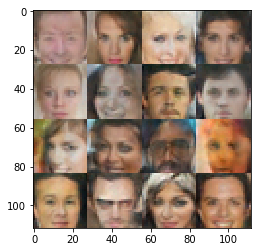

Epoch 3/5... Discriminator Loss: 0.9486... Generator Loss: 1.4348
Epoch 3/5... Discriminator Loss: 1.3981... Generator Loss: 0.5208
Epoch 3/5... Discriminator Loss: 0.7959... Generator Loss: 1.6361
Epoch 3/5... Discriminator Loss: 0.8465... Generator Loss: 1.2018
Epoch 3/5... Discriminator Loss: 1.3577... Generator Loss: 0.5472
Epoch 3/5... Discriminator Loss: 0.9479... Generator Loss: 0.9821
Epoch 3/5... Discriminator Loss: 0.7216... Generator Loss: 1.7236


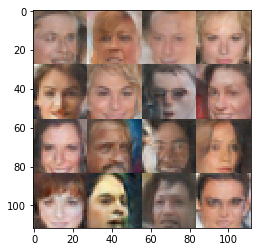

Epoch 3/5... Discriminator Loss: 1.2593... Generator Loss: 0.6843
Epoch 3/5... Discriminator Loss: 2.2232... Generator Loss: 0.2250
Epoch 3/5... Discriminator Loss: 1.2033... Generator Loss: 0.6965
Epoch 3/5... Discriminator Loss: 0.8870... Generator Loss: 1.2034
Epoch 3/5... Discriminator Loss: 0.8175... Generator Loss: 1.2082
Epoch 3/5... Discriminator Loss: 0.9905... Generator Loss: 1.1684
Epoch 3/5... Discriminator Loss: 1.0762... Generator Loss: 0.9006


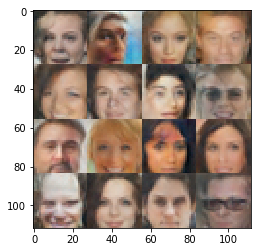

Epoch 3/5... Discriminator Loss: 1.1116... Generator Loss: 0.8403
Epoch 3/5... Discriminator Loss: 0.7746... Generator Loss: 1.5407
Epoch 3/5... Discriminator Loss: 1.0968... Generator Loss: 0.8315
Epoch 3/5... Discriminator Loss: 1.2148... Generator Loss: 0.7668
Epoch 3/5... Discriminator Loss: 0.9249... Generator Loss: 0.9686
Epoch 3/5... Discriminator Loss: 0.9558... Generator Loss: 0.9878


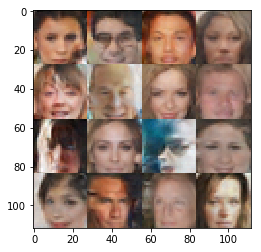

Epoch 3/5... Discriminator Loss: 0.9408... Generator Loss: 0.9642
Epoch 3/5... Discriminator Loss: 0.8140... Generator Loss: 1.6185
Epoch 3/5... Discriminator Loss: 1.1244... Generator Loss: 0.7075
Epoch 3/5... Discriminator Loss: 0.9755... Generator Loss: 0.8768
Epoch 3/5... Discriminator Loss: 0.8759... Generator Loss: 1.0877
Epoch 3/5... Discriminator Loss: 1.2750... Generator Loss: 0.5926
Epoch 3/5... Discriminator Loss: 1.3716... Generator Loss: 0.5103


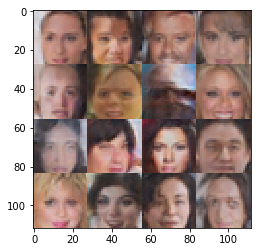

Epoch 3/5... Discriminator Loss: 0.9736... Generator Loss: 1.1100
Epoch 3/5... Discriminator Loss: 1.3719... Generator Loss: 0.6195
Epoch 3/5... Discriminator Loss: 2.6396... Generator Loss: 0.1396
Epoch 3/5... Discriminator Loss: 1.2938... Generator Loss: 0.5984
Epoch 3/5... Discriminator Loss: 1.1260... Generator Loss: 0.8957
Epoch 3/5... Discriminator Loss: 0.9725... Generator Loss: 1.5939
Epoch 3/5... Discriminator Loss: 0.9642... Generator Loss: 1.1042


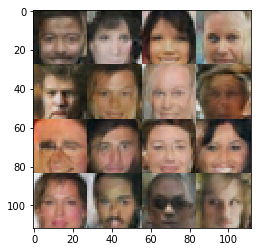

Epoch 3/5... Discriminator Loss: 1.5968... Generator Loss: 0.4202
Epoch 3/5... Discriminator Loss: 1.1238... Generator Loss: 0.8094
Epoch 3/5... Discriminator Loss: 0.7956... Generator Loss: 1.3956
Epoch 3/5... Discriminator Loss: 1.0657... Generator Loss: 0.9640
Epoch 3/5... Discriminator Loss: 1.0782... Generator Loss: 1.3968
Epoch 3/5... Discriminator Loss: 0.8741... Generator Loss: 1.1173


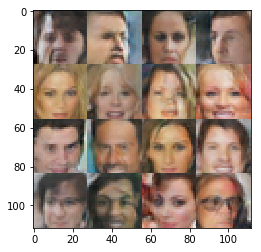

Epoch 3/5... Discriminator Loss: 0.8806... Generator Loss: 1.0926
Epoch 3/5... Discriminator Loss: 0.7179... Generator Loss: 1.6796
Epoch 3/5... Discriminator Loss: 1.3021... Generator Loss: 0.7942
Epoch 3/5... Discriminator Loss: 0.8104... Generator Loss: 1.3832
Epoch 3/5... Discriminator Loss: 1.2215... Generator Loss: 0.6873
Epoch 3/5... Discriminator Loss: 1.1422... Generator Loss: 0.7422
Epoch 3/5... Discriminator Loss: 1.0205... Generator Loss: 1.2341


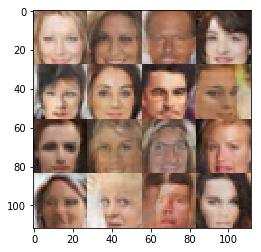

Epoch 3/5... Discriminator Loss: 1.0418... Generator Loss: 0.8357
Epoch 3/5... Discriminator Loss: 0.8649... Generator Loss: 1.0523
Epoch 3/5... Discriminator Loss: 0.9833... Generator Loss: 0.9535
Epoch 3/5... Discriminator Loss: 1.3969... Generator Loss: 0.5305
Epoch 3/5... Discriminator Loss: 1.1047... Generator Loss: 0.7665
Epoch 3/5... Discriminator Loss: 1.0904... Generator Loss: 0.8209
Epoch 3/5... Discriminator Loss: 0.8606... Generator Loss: 1.3485


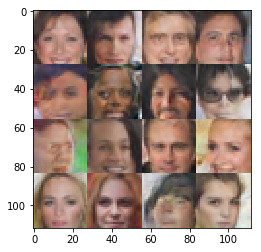

Epoch 3/5... Discriminator Loss: 0.8611... Generator Loss: 1.0846
Epoch 3/5... Discriminator Loss: 0.9280... Generator Loss: 1.0635
Epoch 3/5... Discriminator Loss: 1.1478... Generator Loss: 0.8342
Epoch 3/5... Discriminator Loss: 0.8691... Generator Loss: 1.2531
Epoch 3/5... Discriminator Loss: 1.5033... Generator Loss: 1.8379
Epoch 3/5... Discriminator Loss: 1.1761... Generator Loss: 0.6627


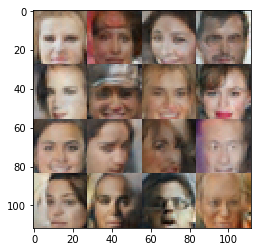

Epoch 3/5... Discriminator Loss: 0.9610... Generator Loss: 1.0121
Epoch 3/5... Discriminator Loss: 0.9601... Generator Loss: 1.0543
Epoch 3/5... Discriminator Loss: 0.7972... Generator Loss: 1.1772
Epoch 3/5... Discriminator Loss: 0.6927... Generator Loss: 1.7330
Epoch 3/5... Discriminator Loss: 1.1115... Generator Loss: 0.9592
Epoch 3/5... Discriminator Loss: 1.3083... Generator Loss: 0.6558
Epoch 3/5... Discriminator Loss: 1.0010... Generator Loss: 0.9520


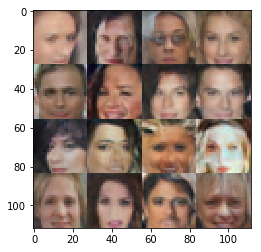

Epoch 3/5... Discriminator Loss: 1.3500... Generator Loss: 0.5826
Epoch 3/5... Discriminator Loss: 0.8328... Generator Loss: 1.4941
Epoch 3/5... Discriminator Loss: 0.8720... Generator Loss: 1.1463
Epoch 3/5... Discriminator Loss: 0.8050... Generator Loss: 1.2402
Epoch 3/5... Discriminator Loss: 0.8100... Generator Loss: 1.1432
Epoch 3/5... Discriminator Loss: 0.9766... Generator Loss: 1.0345
Epoch 3/5... Discriminator Loss: 1.3292... Generator Loss: 0.6835


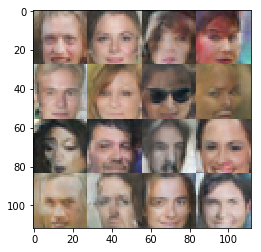

Epoch 3/5... Discriminator Loss: 0.9997... Generator Loss: 0.8976
Epoch 3/5... Discriminator Loss: 1.0513... Generator Loss: 0.9297
Epoch 3/5... Discriminator Loss: 1.2040... Generator Loss: 0.6568
Epoch 3/5... Discriminator Loss: 0.8122... Generator Loss: 1.1416
Epoch 3/5... Discriminator Loss: 0.6700... Generator Loss: 1.9418
Epoch 3/5... Discriminator Loss: 0.8090... Generator Loss: 1.2520


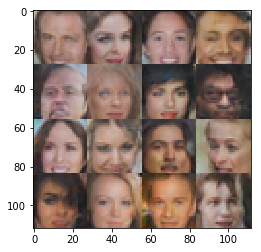

Epoch 3/5... Discriminator Loss: 1.5263... Generator Loss: 0.4496
Epoch 3/5... Discriminator Loss: 1.2849... Generator Loss: 0.6302
Epoch 3/5... Discriminator Loss: 1.1559... Generator Loss: 0.7007
Epoch 3/5... Discriminator Loss: 1.0465... Generator Loss: 0.7899
Epoch 3/5... Discriminator Loss: 0.7890... Generator Loss: 2.0102
Epoch 3/5... Discriminator Loss: 1.2650... Generator Loss: 0.7650
Epoch 3/5... Discriminator Loss: 0.9357... Generator Loss: 1.1738


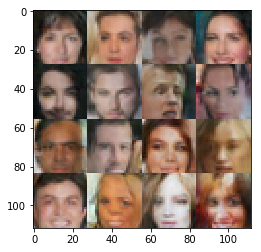

Epoch 3/5... Discriminator Loss: 1.0637... Generator Loss: 0.8231
Epoch 3/5... Discriminator Loss: 0.8696... Generator Loss: 1.1285
Epoch 3/5... Discriminator Loss: 0.8722... Generator Loss: 1.4148
Epoch 3/5... Discriminator Loss: 0.9109... Generator Loss: 1.4033
Epoch 3/5... Discriminator Loss: 1.1026... Generator Loss: 1.8763
Epoch 3/5... Discriminator Loss: 1.6996... Generator Loss: 0.3868
Epoch 3/5... Discriminator Loss: 1.2573... Generator Loss: 0.6468


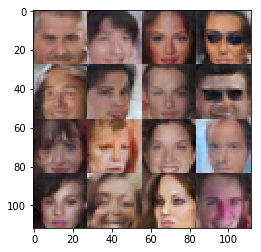

Epoch 3/5... Discriminator Loss: 0.8064... Generator Loss: 1.6494
Epoch 3/5... Discriminator Loss: 1.0087... Generator Loss: 0.8207
Epoch 3/5... Discriminator Loss: 0.9899... Generator Loss: 1.2645
Epoch 3/5... Discriminator Loss: 0.7490... Generator Loss: 1.3254
Epoch 3/5... Discriminator Loss: 1.0731... Generator Loss: 0.7838
Epoch 3/5... Discriminator Loss: 0.9950... Generator Loss: 0.9470


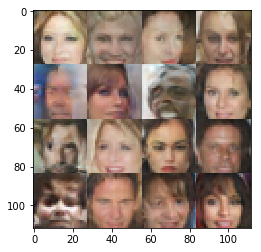

Epoch 3/5... Discriminator Loss: 1.3248... Generator Loss: 1.6836
Epoch 3/5... Discriminator Loss: 1.0132... Generator Loss: 0.8718
Epoch 3/5... Discriminator Loss: 1.3233... Generator Loss: 0.6409
Epoch 3/5... Discriminator Loss: 1.0904... Generator Loss: 0.8828
Epoch 3/5... Discriminator Loss: 1.5219... Generator Loss: 0.5493
Epoch 3/5... Discriminator Loss: 0.9998... Generator Loss: 0.9441
Epoch 3/5... Discriminator Loss: 0.6656... Generator Loss: 1.6531


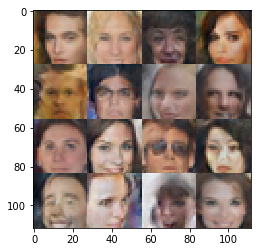

Epoch 3/5... Discriminator Loss: 1.5497... Generator Loss: 0.4447
Epoch 3/5... Discriminator Loss: 0.9261... Generator Loss: 1.3494
Epoch 3/5... Discriminator Loss: 0.8024... Generator Loss: 1.2818
Epoch 3/5... Discriminator Loss: 1.1917... Generator Loss: 0.6456
Epoch 3/5... Discriminator Loss: 0.9531... Generator Loss: 1.1592
Epoch 3/5... Discriminator Loss: 1.3392... Generator Loss: 0.6378
Epoch 3/5... Discriminator Loss: 1.5752... Generator Loss: 0.3855


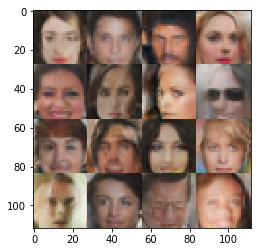

Epoch 3/5... Discriminator Loss: 1.0062... Generator Loss: 1.2898
Epoch 3/5... Discriminator Loss: 0.7774... Generator Loss: 1.3675
Epoch 4/5... Discriminator Loss: 1.0384... Generator Loss: 0.8414


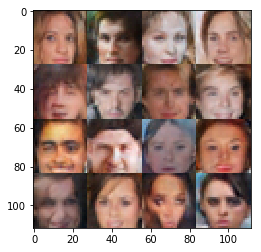

Epoch 4/5... Discriminator Loss: 1.0128... Generator Loss: 0.8931
Epoch 4/5... Discriminator Loss: 0.9115... Generator Loss: 1.1222
Epoch 4/5... Discriminator Loss: 1.0668... Generator Loss: 0.7804
Epoch 4/5... Discriminator Loss: 1.2784... Generator Loss: 0.6121
Epoch 4/5... Discriminator Loss: 0.7650... Generator Loss: 1.3067
Epoch 4/5... Discriminator Loss: 0.8253... Generator Loss: 1.6076


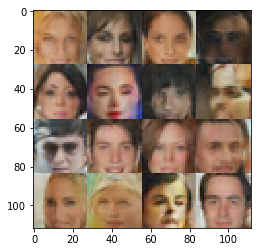

Epoch 4/5... Discriminator Loss: 0.9980... Generator Loss: 0.9108
Epoch 4/5... Discriminator Loss: 0.8610... Generator Loss: 1.1568
Epoch 4/5... Discriminator Loss: 1.5189... Generator Loss: 0.6529
Epoch 4/5... Discriminator Loss: 0.8118... Generator Loss: 1.3395
Epoch 4/5... Discriminator Loss: 1.0063... Generator Loss: 0.9968
Epoch 4/5... Discriminator Loss: 0.9953... Generator Loss: 0.9152
Epoch 4/5... Discriminator Loss: 1.1142... Generator Loss: 0.8595


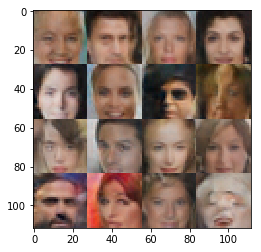

Epoch 4/5... Discriminator Loss: 1.1128... Generator Loss: 0.8110
Epoch 4/5... Discriminator Loss: 1.1354... Generator Loss: 0.8179
Epoch 4/5... Discriminator Loss: 1.0827... Generator Loss: 0.7794
Epoch 4/5... Discriminator Loss: 0.9632... Generator Loss: 0.9799
Epoch 4/5... Discriminator Loss: 1.3399... Generator Loss: 0.4954
Epoch 4/5... Discriminator Loss: 1.3120... Generator Loss: 0.5751
Epoch 4/5... Discriminator Loss: 1.0254... Generator Loss: 0.8540


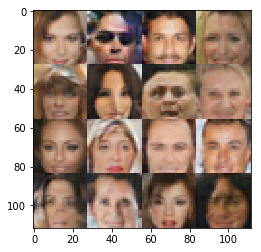

Epoch 4/5... Discriminator Loss: 1.1428... Generator Loss: 0.9017
Epoch 4/5... Discriminator Loss: 0.9141... Generator Loss: 1.0644
Epoch 4/5... Discriminator Loss: 0.6241... Generator Loss: 1.7073
Epoch 4/5... Discriminator Loss: 0.9663... Generator Loss: 0.9342
Epoch 4/5... Discriminator Loss: 0.7642... Generator Loss: 1.2086
Epoch 4/5... Discriminator Loss: 1.1648... Generator Loss: 0.7942


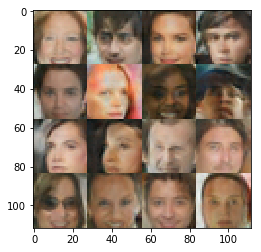

Epoch 4/5... Discriminator Loss: 1.8610... Generator Loss: 0.2982
Epoch 4/5... Discriminator Loss: 1.0899... Generator Loss: 0.8334
Epoch 4/5... Discriminator Loss: 0.9090... Generator Loss: 0.9360
Epoch 4/5... Discriminator Loss: 1.0722... Generator Loss: 0.8300
Epoch 4/5... Discriminator Loss: 1.1655... Generator Loss: 0.7588
Epoch 4/5... Discriminator Loss: 0.9852... Generator Loss: 1.0877
Epoch 4/5... Discriminator Loss: 1.5125... Generator Loss: 0.5323


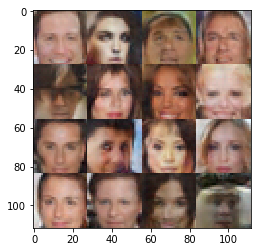

Epoch 4/5... Discriminator Loss: 1.3622... Generator Loss: 0.5733
Epoch 4/5... Discriminator Loss: 1.4047... Generator Loss: 0.5444
Epoch 4/5... Discriminator Loss: 1.0063... Generator Loss: 0.9021
Epoch 4/5... Discriminator Loss: 1.3528... Generator Loss: 0.5926
Epoch 4/5... Discriminator Loss: 1.3264... Generator Loss: 1.0374
Epoch 4/5... Discriminator Loss: 0.8118... Generator Loss: 1.2519
Epoch 4/5... Discriminator Loss: 1.1824... Generator Loss: 0.7462


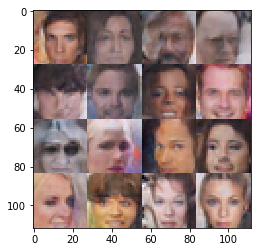

Epoch 4/5... Discriminator Loss: 0.8011... Generator Loss: 1.1710


In [ ]:
batch_size = 32
z_dim = 100
learning_rate = 0.001
beta1 = 0.5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 5

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.